In [2]:
import numpy as np


# === Load the file ===
path = "20251128_images_2/output.txt"

data = []
with open(path, "r") as f:
    for line in f:
        parts = line.strip().split('/')
        if len(parts) != 5 or parts[0] != 'IS':
            continue  # skip malformed lines

        hour = float(parts[1])
        minute = float(parts[2])
        sec = float(parts[3])
        micro = float(parts[4])

        # integrate microseconds into seconds (millisecond precision)
        sec_with_ms = sec + round(micro / 1e6, 3)
        data.append([hour, minute, sec_with_ms])

# === Convert to NumPy array ===
image_timestamps = np.array(data, dtype=float)
print(image_timestamps.shape)
print(image_timestamps[:5])  # preview first 5 rows


(1027, 3)
[[ 6.    20.    27.316]
 [ 6.    20.    27.316]
 [ 6.    20.    27.332]
 [ 6.    20.    27.332]
 [ 6.    20.    27.332]]


In [3]:
import numpy as np

data = []
with open(path, "r") as f:
    for line in f:
        parts = line.strip().split('/')
        if len(parts) != 5 or parts[0] != 'IS':
            continue  # skip malformed lines

        hour = float(parts[1])
        minute = float(parts[2])
        sec = float(parts[3])
        micro = float(parts[4])

        # integrate microseconds into seconds (millisecond precision)
        sec_with_ms = sec + round(micro / 1e6, 3)
        data.append([hour, minute, sec_with_ms])

# === Convert to NumPy array ===
image_timestamps = np.array(data, dtype=float)
print(image_timestamps.shape)
print(image_timestamps[:5])  # preview first 5 rows


(1027, 3)
[[ 6.    20.    27.316]
 [ 6.    20.    27.316]
 [ 6.    20.    27.332]
 [ 6.    20.    27.332]
 [ 6.    20.    27.332]]


In [6]:
import numpy as np
from scipy.spatial.transform import Rotation, Slerp

def hms_to_sec(hms):
    return hms[:, 0] * 3600 + hms[:, 1] * 60 + hms[:, 2]

def interpolate_robot_pose_safe(image_timestamps, robot_timestamps, robot_ee_matrices):
    # Convert to seconds
    t_robot = hms_to_sec(robot_timestamps)
    t_img = hms_to_sec(image_timestamps)

    # Extract translation
    p_robot = robot_ee_matrices[:, :3, 3]

    # Prepare rotation interpolation
    R_robot = Rotation.from_matrix(robot_ee_matrices[:, :3, :3])
    slerp = Slerp(t_robot, R_robot)

    # Clamp image times to within valid robot range
    t_min, t_max = t_robot[0], t_robot[-1]
    t_img_clamped = np.clip(t_img, t_min, t_max)

    # Interpolate rotation (clamped)
    R_interp = slerp(t_img_clamped)

    # Interpolate translation (np.interp supports extrapolation)
    p_interp = np.empty((len(t_img), 3))
    for i in range(3):
        p_interp[:, i] = np.interp(t_img, t_robot, p_robot[:, i])

    # Assemble 4×4 matrices
    T_interp = np.zeros((len(t_img), 4, 4))
    T_interp[:, 3, 3] = 1.0
    T_interp[:, :3, :3] = R_interp.as_matrix()
    T_interp[:, :3, 3] = p_interp

    # Optional: show how much extrapolation occurred
    before = np.sum(t_img < t_min)
    after  = np.sum(t_img > t_max)
    if before or after:
        print(f"⚠️ Clamped {before} early and {after} late image timestamps to [{t_min:.3f}, {t_max:.3f}]")

    return T_interp

import numpy as np

path = "20251128_robot_2/timestamps.txt"

timestamps = []
matrices = []

with open(path, "r") as f:
    for line in f:
        line = line.strip()
        if not line or '|' not in line:
            continue

        parts = [p.strip() for p in line.split('|')]
        if len(parts) < 3:
            continue

        # Parse timestamp
        t_str = parts[1]
        h, m, s = t_str.split(':')
        timestamps.append([float(h), float(m), float(s)])

        # Parse 4x4 matrix (flattened)
        mat_values = [float(v) for v in parts[2].split()]
        if len(mat_values) == 16:
            matrices.append(np.array(mat_values).reshape(4, 4))
        else:
            print(f"⚠️ Warning: malformed line -> {line}")

robot_timestamps = np.array(timestamps)
robot_ee_matrices = np.array(matrices)  # shape (N, 4, 4)

print("✅ timestamps:", robot_timestamps.shape)
print("✅ matrices:", robot_ee_matrices.shape)
print("Example:\n", robot_ee_matrices[0])


T_interp = interpolate_robot_pose_safe(image_timestamps, robot_timestamps, robot_ee_matrices)
print("✅ Interpolated EE matrices:", T_interp.shape)


✅ timestamps: (350, 3)
✅ matrices: (350, 4, 4)
Example:
 [[ 3.97415e-01 -9.17639e-01 -7.82000e-04 -4.56597e-01]
 [-9.17591e-01 -3.97385e-01 -1.05480e-02 -3.97870e-02]
 [ 9.36800e-03  4.91000e-03 -9.99944e-01  2.03432e-01]
 [ 0.00000e+00  0.00000e+00  0.00000e+00  1.00000e+00]]
⚠️ Clamped 150 early and 1 late image timestamps to [22832.952, 22923.838]
✅ Interpolated EE matrices: (1027, 4, 4)


Split indices: [198 223 275 299 354 378 428 461 496 543 592 646 711 749 819 846 911 936
 998]

===== Group Statistics =====
Group 1: 198 poses,  Max sequential dist = 0.0009 m
Group 2: 25 poses,  Max sequential dist = 0.0016 m
Group 3: 52 poses,  Max sequential dist = 0.0016 m
Group 4: 24 poses,  Max sequential dist = 0.0012 m
Group 5: 55 poses,  Max sequential dist = 0.0012 m
Group 6: 24 poses,  Max sequential dist = 0.0011 m
Group 7: 50 poses,  Max sequential dist = 0.0015 m
Group 8: 33 poses,  Max sequential dist = 0.0013 m
Group 9: 35 poses,  Max sequential dist = 0.0016 m
Group 10: 47 poses,  Max sequential dist = 0.0007 m
Group 11: 49 poses,  Max sequential dist = 0.0012 m
Group 12: 54 poses,  Max sequential dist = 0.0008 m
Group 13: 65 poses,  Max sequential dist = 0.0008 m
Group 14: 38 poses,  Max sequential dist = 0.0011 m
Group 15: 70 poses,  Max sequential dist = 0.0010 m
Group 16: 27 poses,  Max sequential dist = 0.0016 m
Group 17: 65 poses,  Max sequential dist = 0.0010 m


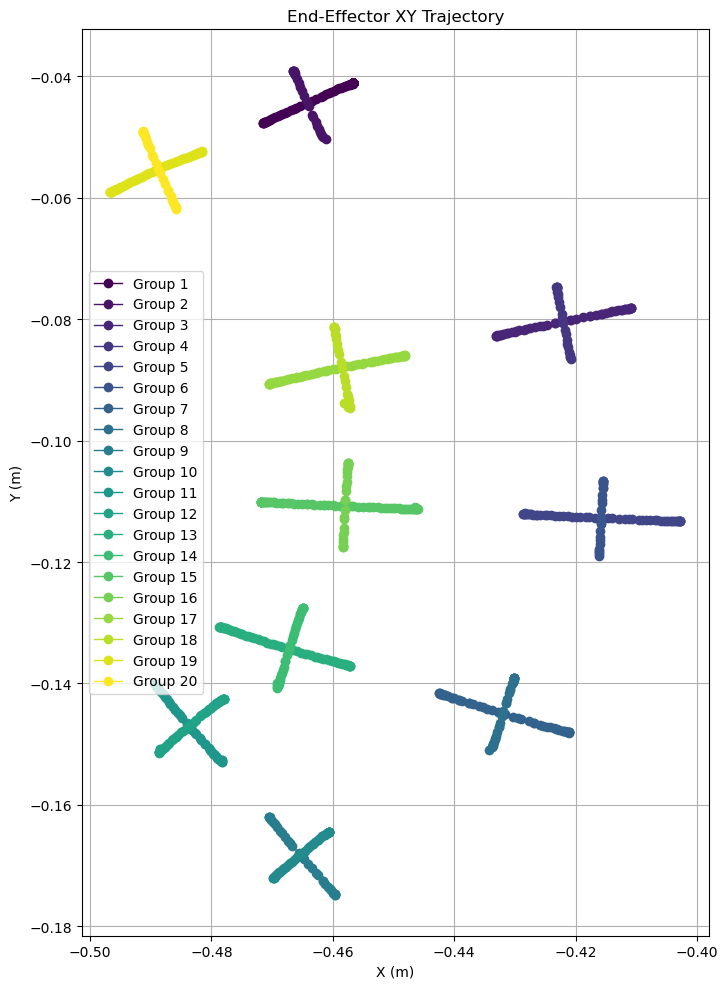

In [7]:
import numpy as np
import matplotlib.pyplot as plt

positions = np.array([T_interp[i][:, 3][:3] + 0.128 * T_interp[i][:, 2][:3]
                      for i in range(T_interp.shape[0])])

# positions: (N,3)
N = len(positions)
dist = np.linalg.norm(np.diff(positions[:, :2], axis=0), axis=1)

# === Find split indices for groups ===
num_groups = 20
split_indices = np.argsort(dist)[-(num_groups - 1):] + 1
split_indices = np.sort(split_indices)
print("Split indices:", split_indices)

# === Assign group labels ===
groups = np.zeros(N, dtype=int)
start = 0
for g, end in enumerate(np.append(split_indices, N)):
    groups[start:end] = g
    start = end

# === Compute info for each group ===
print("\n===== Group Statistics =====")
for g in range(num_groups):
    idx = np.where(groups == g)[0]

    # number of poses
    count = len(idx)

    # sequential distances inside group
    if count > 1:
        local_dist = np.linalg.norm(np.diff(positions[idx, :2], axis=0), axis=1)
        max_local_dist = np.max(local_dist)
    else:
        max_local_dist = 0.0

    print(f"Group {g+1}: {count} poses,  Max sequential dist = {max_local_dist:.4f} m")

# === Plot ===
fig, ax = plt.subplots(figsize=(10, 10))
colors = plt.cm.viridis(np.linspace(0, 1, num_groups))

for g in range(num_groups):
    idx = groups == g
    ax.plot(positions[idx, 0], positions[idx, 1],
            'o-', lw=1, color=colors[g], label=f"Group {g+1}")

ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
ax.set_title("End-Effector XY Trajectory")
ax.grid(True)
ax.set_aspect('equal', adjustable='box')
ax.legend()
plt.tight_layout()
plt.show()


In [12]:
import numpy as np
import torch
import torch.nn as nn
from skimage.transform import resize
import matplotlib
import matplotlib.pyplot as plt

class CircleRegressorCNN_K10(nn.Module):
    def __init__(self):
        super().__init__()
        window_size = 12
        padding_size = int(window_size // 2)
        self.features = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=window_size, padding=padding_size), nn.BatchNorm2d(16), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, kernel_size=window_size, padding=padding_size), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=window_size, padding=padding_size), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=window_size, padding=padding_size), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(128, 256, kernel_size=window_size, padding=padding_size), nn.BatchNorm2d(256), nn.ReLU(), nn.AdaptiveAvgPool2d((1,1))
        )
        self.head = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 128), nn.ReLU(),
            nn.Linear(128, 64), nn.ReLU(),
            nn.Linear(64, 3),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.head(self.features(x))


# =====================================================================
# MAIN INFERENCE PIPELINE
# =====================================================================
def load_and_predict(image_path):

    # ----------------------------
    # 1. Load saved checkpoint
    # ----------------------------
    ckpt_path = "circle_regressor_volunteer_split_w12.pt"
    checkpoint = torch.load(ckpt_path, map_location="cpu")

    model = CircleRegressorCNN_K10()
    model.load_state_dict(checkpoint["model_state"])
    model.eval()

    # Training params saved in checkpoint
    H = checkpoint["H"]
    W = checkpoint["W"]
    MAX_R = checkpoint["MAX_R"]

    # ----------------------------
    # 2. Load image (sample code)
    # ----------------------------
    img = np.load(image_path).astype(np.float32)   # <--- your raw npy image
    print("Raw image:", img.shape, "mean", np.mean(img))

    # ----------------------------
    # 3. Apply Greys_r colormap
    # ----------------------------
    cmap = matplotlib.cm.get_cmap('Greys_r')
    img = cmap((img - 0) / (255 - 0), bytes=True).astype(np.uint16)[:, :, 0]

    # ----------------------------
    # 4. Normalize to [0,1]
    # ----------------------------
    mx = float(img.max())
    if mx > 0:
        img = img / (255.0 if mx > 1 else mx)

    # ----------------------------
    # 5. Resize to model input size
    # ----------------------------
    img = resize(img, (H, W), preserve_range=True).astype(np.float32)
    mx = float(img.max())
    if mx > 0:
        img = img / (255.0 if mx > 1 else mx)

    # ----------------------------
    # 6. Convert to torch tensor
    # ----------------------------
    x = torch.from_numpy(img[None, None, :, :])  # shape (1,1,H,W)

    # ----------------------------
    # 7. Predict
    # ----------------------------
    with torch.no_grad():
        pred = model(x).squeeze(0).numpy()

    # ----------------------------
    # 8. Convert normalized outputs
    # ----------------------------
    cx = float(pred[0]) * W
    cy = float(pred[1]) * H
    r  = float(pred[2]) * MAX_R

    print(f"\nPredicted: cx={cx:.2f}, cy={cy:.2f}, r={r:.2f}")
    return cx, cy, r


# =====================================================================
# Example usage
# =====================================================================
if __name__ == "__main__":
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_0.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_1.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_2.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_3.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_4.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_5.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_6.npy")
    cx, cy, r = load_and_predict(r"C:\Users\labadmin\Desktop\RUSS2\20251128_images_2\test_7.npy")



Raw image: (1083, 371) mean 22.645266

Predicted: cx=104.31, cy=237.32, r=95.54
Raw image: (1083, 371) mean 18.974955

Predicted: cx=121.87, cy=204.30, r=94.02
Raw image: (1083, 371) mean 20.312391

Predicted: cx=112.55, cy=194.68, r=84.91
Raw image: (1083, 371) mean 21.31275


C:\Users\labadmin\AppData\Local\Temp\ipykernel_3776\2818008305.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = matplotlib.cm.get_cmap('Greys_r')



Predicted: cx=124.14, cy=200.91, r=84.60
Raw image: (1083, 371) mean 24.06804

Predicted: cx=137.75, cy=221.75, r=84.64
Raw image: (1083, 371) mean 23.361078

Predicted: cx=129.51, cy=201.82, r=83.04
Raw image: (1083, 371) mean 22.393965

Predicted: cx=124.42, cy=199.86, r=76.44
Raw image: (1083, 371) mean 22.36728

Predicted: cx=125.56, cy=200.89, r=76.68


Found 250 images to plot (offset=3000).

[1] Displaying: 8996_channel_0.npy


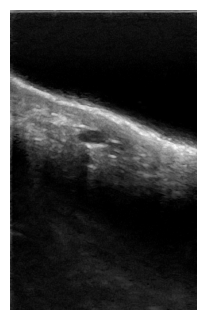

[2] Displaying: 8999_channel_0.npy


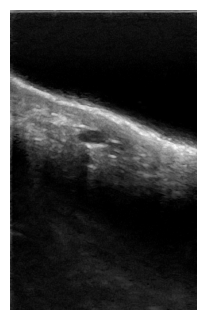

[3] Displaying: 9002_channel_0.npy


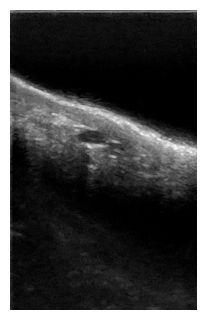

[4] Displaying: 9005_channel_0.npy


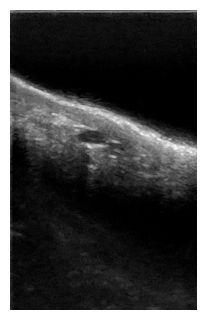

[5] Displaying: 9008_channel_0.npy


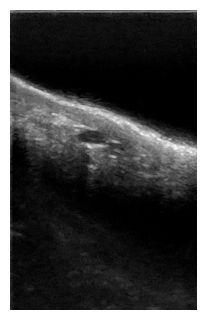

[6] Displaying: 9011_channel_0.npy


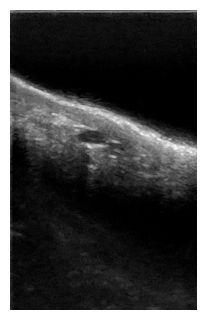

[7] Displaying: 9014_channel_0.npy


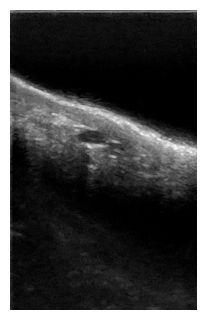

[8] Displaying: 9017_channel_0.npy


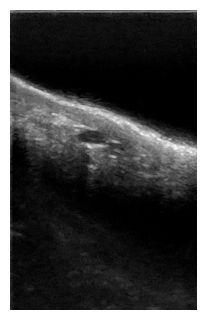

[9] Displaying: 9020_channel_0.npy


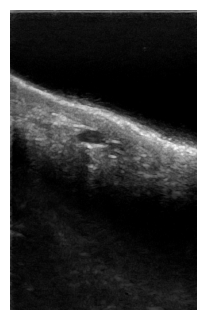

[10] Displaying: 9023_channel_0.npy


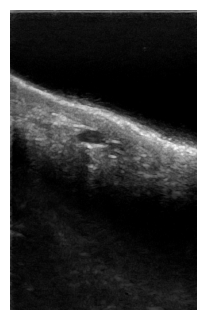

[11] Displaying: 9026_channel_0.npy


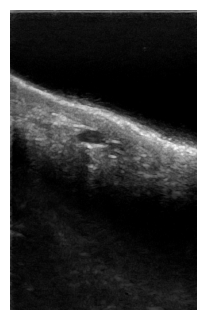

[12] Displaying: 9029_channel_0.npy


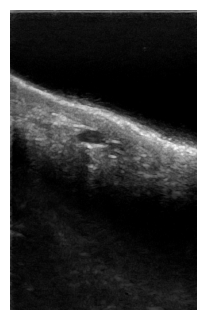

[13] Displaying: 9032_channel_0.npy


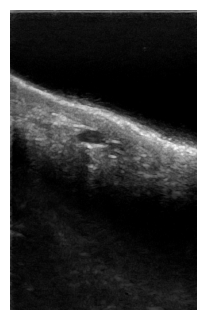

[14] Displaying: 9035_channel_0.npy


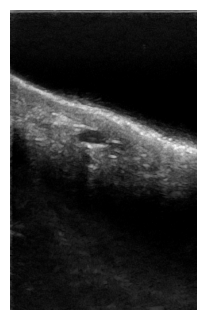

[15] Displaying: 9038_channel_0.npy


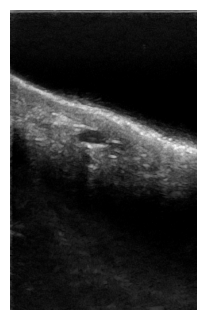

[16] Displaying: 9041_channel_0.npy


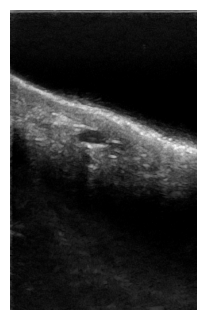

[17] Displaying: 9044_channel_0.npy


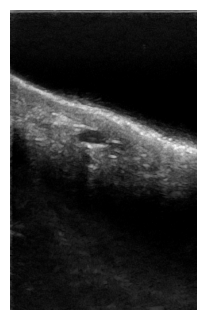

[18] Displaying: 9047_channel_0.npy


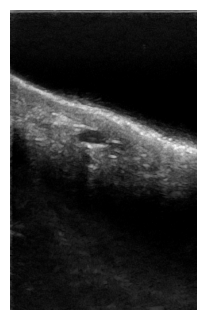

[19] Displaying: 9050_channel_0.npy


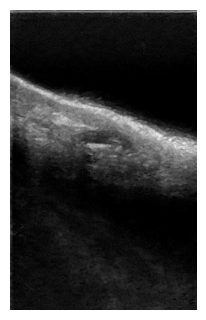

[20] Displaying: 9053_channel_0.npy


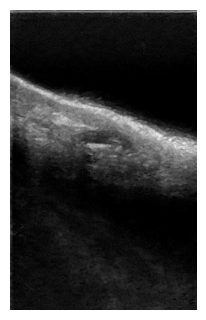

[21] Displaying: 9056_channel_0.npy


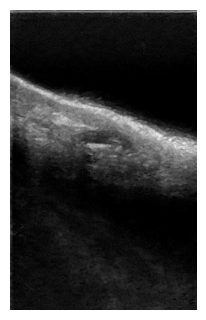

[22] Displaying: 9059_channel_0.npy


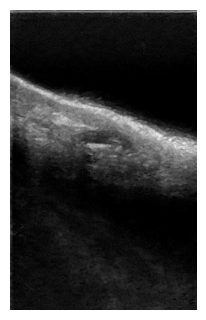

[23] Displaying: 9062_channel_0.npy


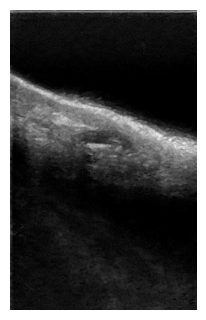

[24] Displaying: 9065_channel_0.npy


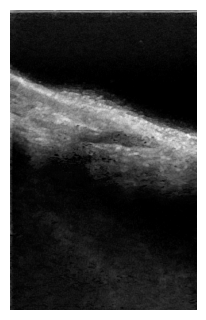

[25] Displaying: 9068_channel_0.npy


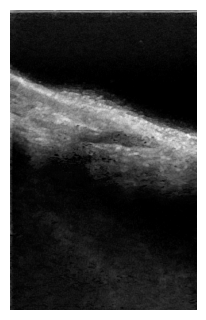

[26] Displaying: 9071_channel_0.npy


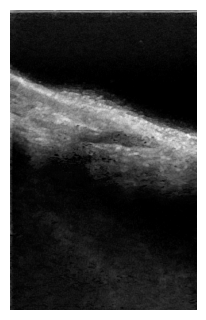

[27] Displaying: 9074_channel_0.npy


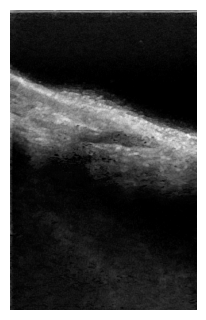

[28] Displaying: 9077_channel_0.npy


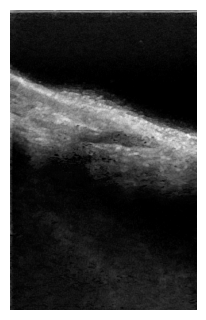

[29] Displaying: 9080_channel_0.npy


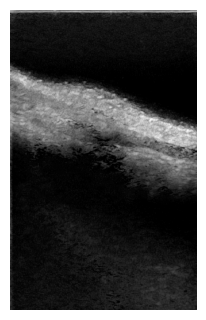

[30] Displaying: 9083_channel_0.npy


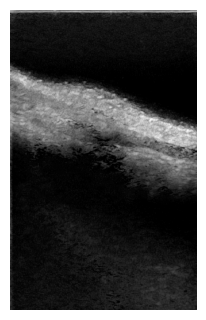

[31] Displaying: 9086_channel_0.npy


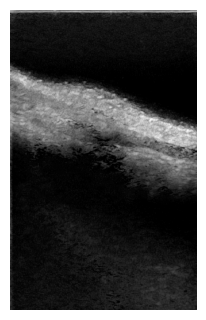

[32] Displaying: 9089_channel_0.npy


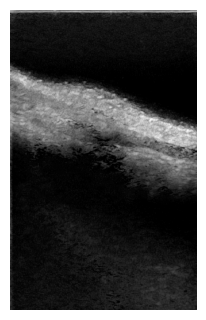

[33] Displaying: 9092_channel_0.npy


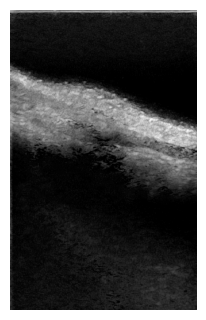

[34] Displaying: 9095_channel_0.npy


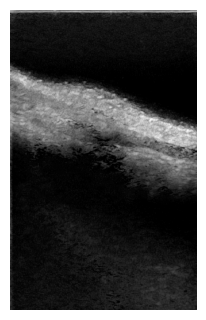

[35] Displaying: 9098_channel_0.npy


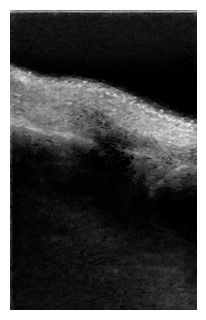

[36] Displaying: 9101_channel_0.npy


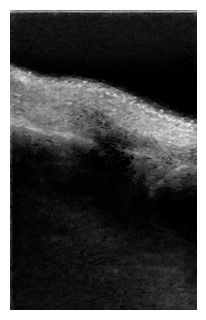

[37] Displaying: 9104_channel_0.npy


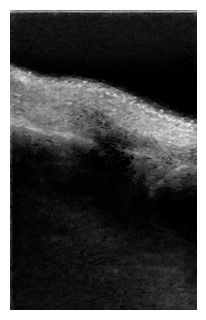

[38] Displaying: 9107_channel_0.npy


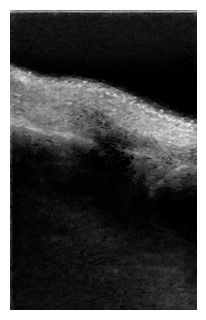

[39] Displaying: 9110_channel_0.npy


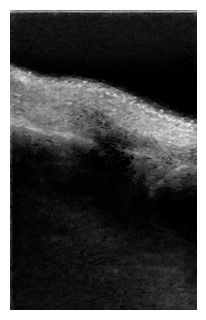

[40] Displaying: 9113_channel_0.npy


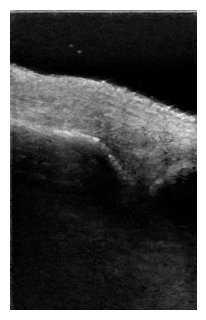

[41] Displaying: 9116_channel_0.npy


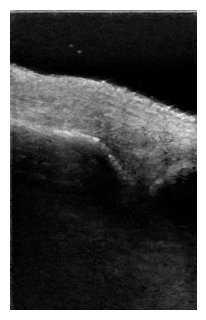

[42] Displaying: 9119_channel_0.npy


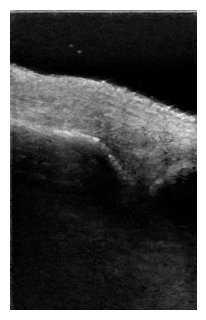

[43] Displaying: 9122_channel_0.npy


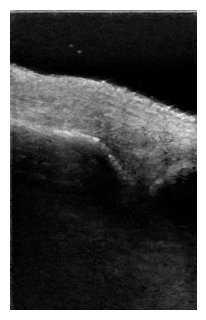

[44] Displaying: 9125_channel_0.npy


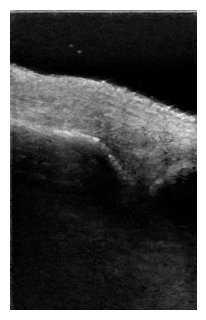

[45] Displaying: 9128_channel_0.npy


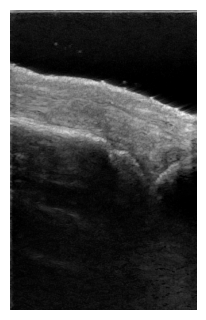

[46] Displaying: 9131_channel_0.npy


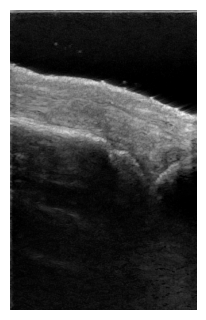

[47] Displaying: 9134_channel_0.npy


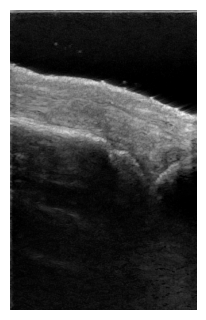

[48] Displaying: 9137_channel_0.npy


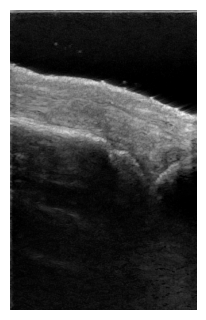

[49] Displaying: 9140_channel_0.npy


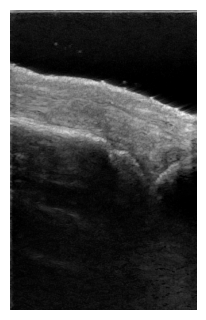

[50] Displaying: 9143_channel_0.npy


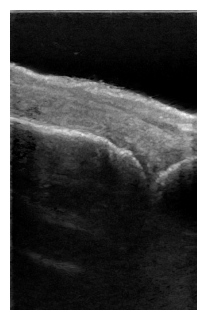

[51] Displaying: 9146_channel_0.npy


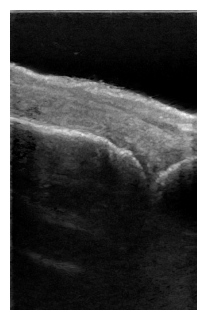

[52] Displaying: 9149_channel_0.npy


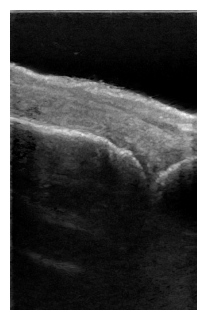

[53] Displaying: 9152_channel_0.npy


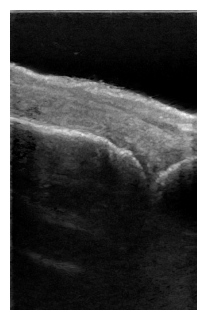

[54] Displaying: 9155_channel_0.npy


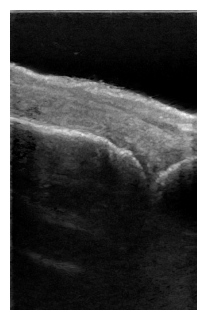

[55] Displaying: 9158_channel_0.npy


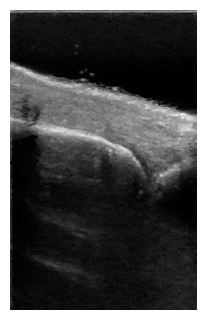

[56] Displaying: 9161_channel_0.npy


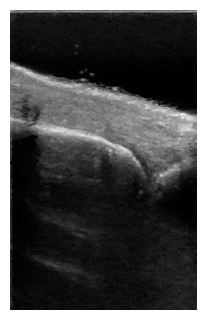

[57] Displaying: 9164_channel_0.npy


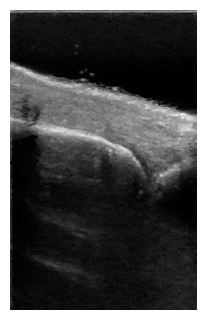

[58] Displaying: 9167_channel_0.npy


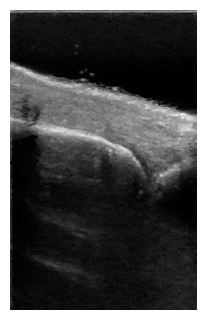

[59] Displaying: 9170_channel_0.npy


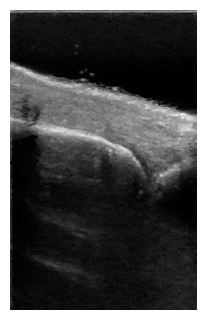

[60] Displaying: 9173_channel_0.npy


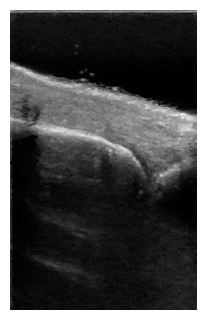

[61] Displaying: 9176_channel_0.npy


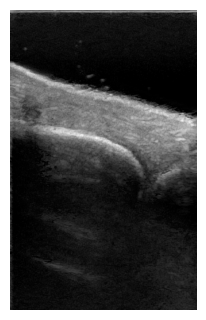

[62] Displaying: 9179_channel_0.npy


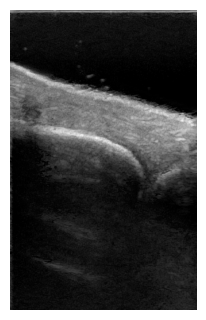

[63] Displaying: 9182_channel_0.npy


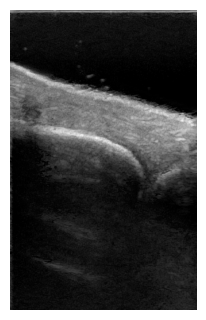

[64] Displaying: 9185_channel_0.npy


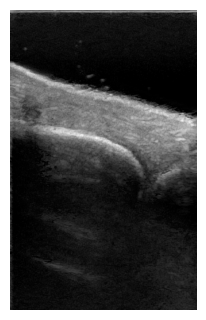

[65] Displaying: 9188_channel_0.npy


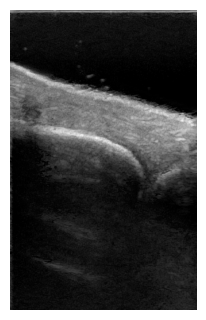

[66] Displaying: 9191_channel_0.npy


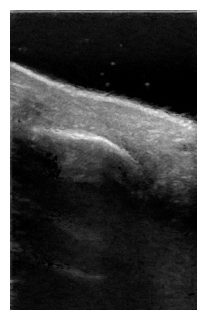

[67] Displaying: 9194_channel_0.npy


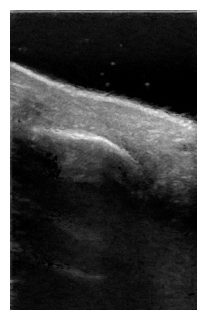

[68] Displaying: 9197_channel_0.npy


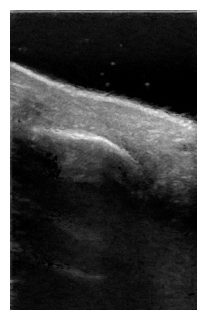

[69] Displaying: 9200_channel_0.npy


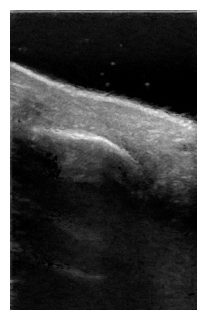

[70] Displaying: 9203_channel_0.npy


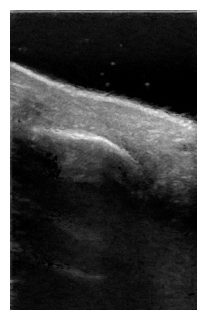

[71] Displaying: 9206_channel_0.npy


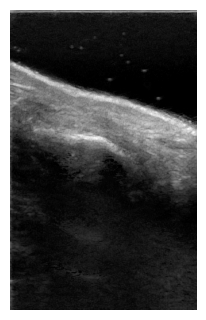

[72] Displaying: 9209_channel_0.npy


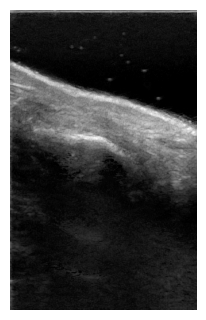

[73] Displaying: 9212_channel_0.npy


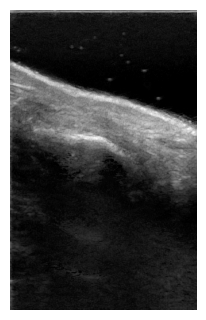

[74] Displaying: 9215_channel_0.npy


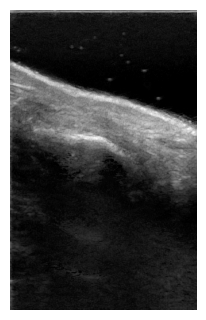

[75] Displaying: 9218_channel_0.npy


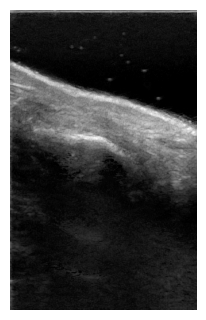

[76] Displaying: 9223_channel_0.npy


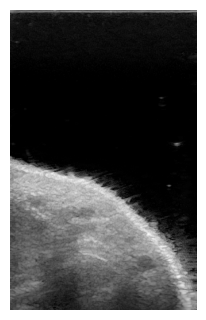

[77] Displaying: 9226_channel_0.npy


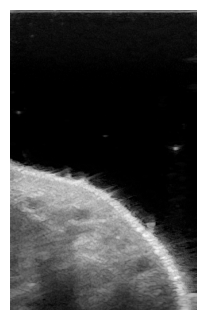

[78] Displaying: 9229_channel_0.npy


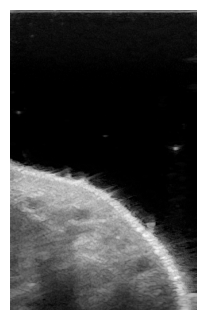

[79] Displaying: 9232_channel_0.npy


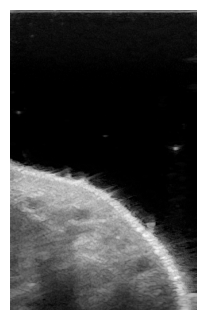

[80] Displaying: 9235_channel_0.npy


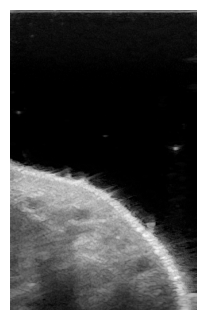

[81] Displaying: 9238_channel_0.npy


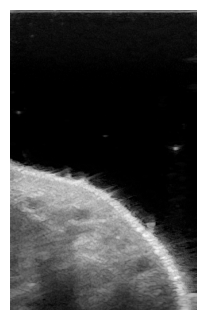

[82] Displaying: 9241_channel_0.npy


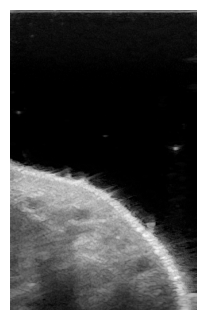

[83] Displaying: 9244_channel_0.npy


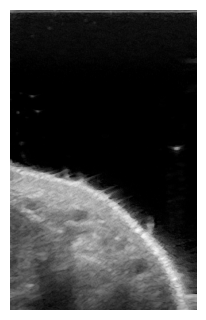

[84] Displaying: 9247_channel_0.npy


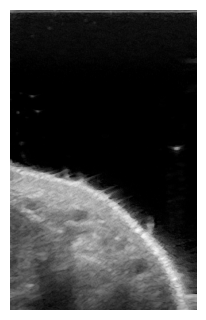

[85] Displaying: 9250_channel_0.npy


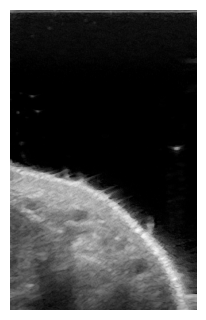

[86] Displaying: 9253_channel_0.npy


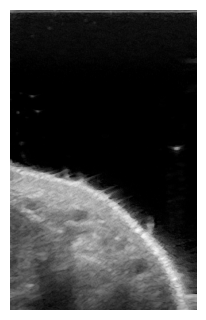

[87] Displaying: 9256_channel_0.npy


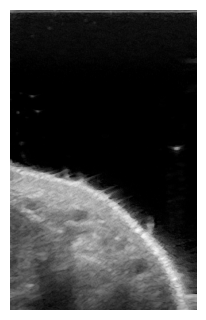

[88] Displaying: 9259_channel_0.npy


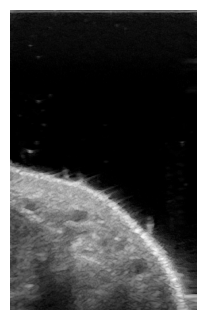

[89] Displaying: 9262_channel_0.npy


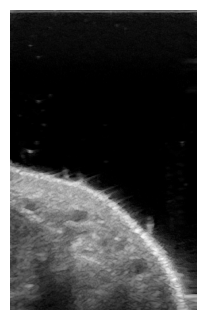

[90] Displaying: 9265_channel_0.npy


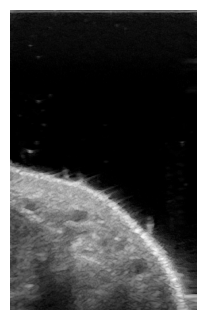

[91] Displaying: 9268_channel_0.npy


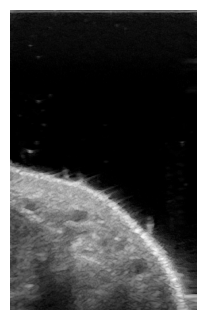

[92] Displaying: 9271_channel_0.npy


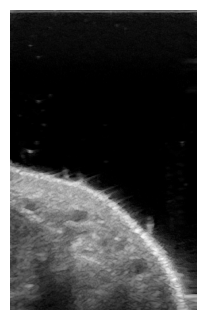

[93] Displaying: 9274_channel_0.npy


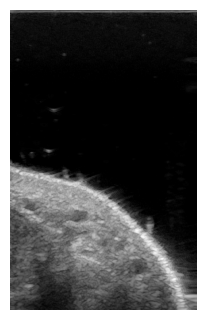

[94] Displaying: 9277_channel_0.npy


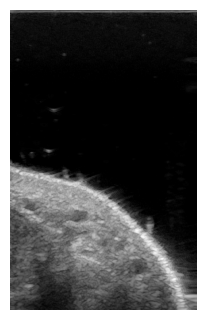

[95] Displaying: 9280_channel_0.npy


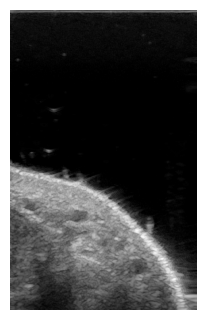

[96] Displaying: 9283_channel_0.npy


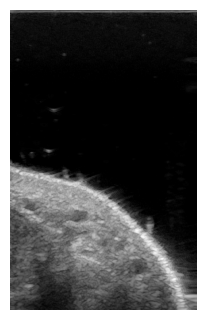

[97] Displaying: 9286_channel_0.npy


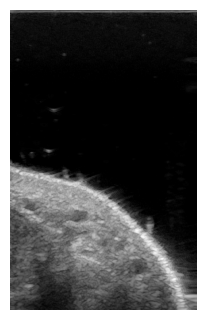

[98] Displaying: 9289_channel_0.npy


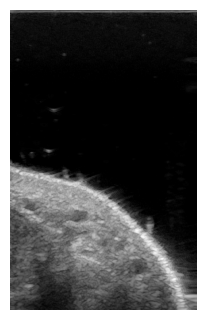

[99] Displaying: 9292_channel_0.npy


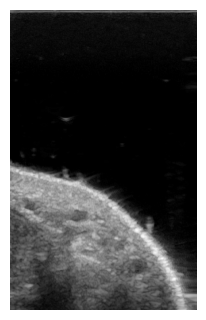

[100] Displaying: 9295_channel_0.npy


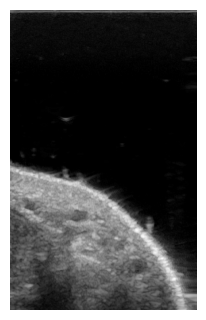

[101] Displaying: 9298_channel_0.npy


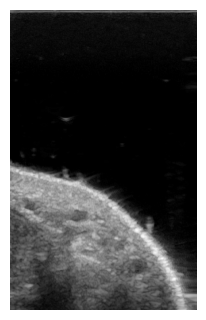

[102] Displaying: 9301_channel_0.npy


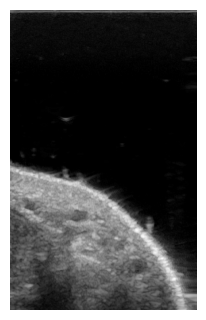

[103] Displaying: 9304_channel_0.npy


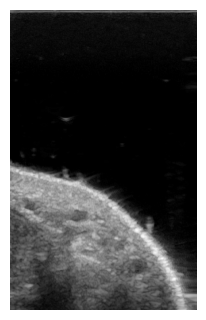

[104] Displaying: 9307_channel_0.npy


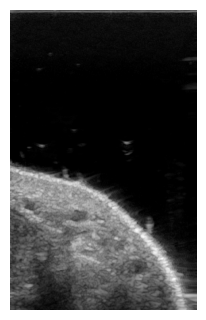

[105] Displaying: 9310_channel_0.npy


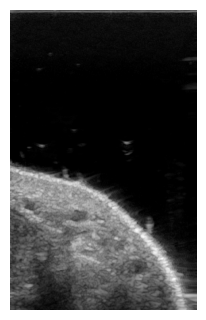

[106] Displaying: 9313_channel_0.npy


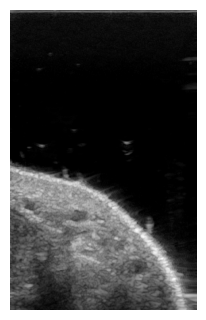

[107] Displaying: 9316_channel_0.npy


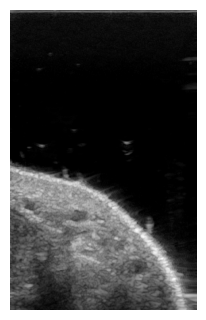

[108] Displaying: 9319_channel_0.npy


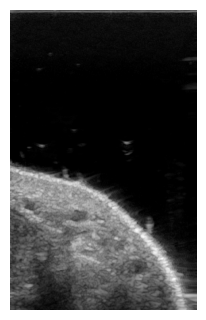

[109] Displaying: 9322_channel_0.npy


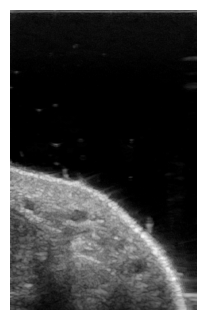

[110] Displaying: 9325_channel_0.npy


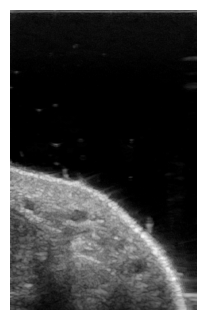

[111] Displaying: 9328_channel_0.npy


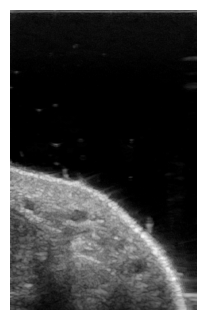

[112] Displaying: 9331_channel_0.npy


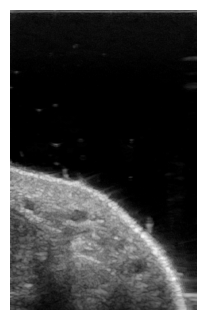

[113] Displaying: 9334_channel_0.npy


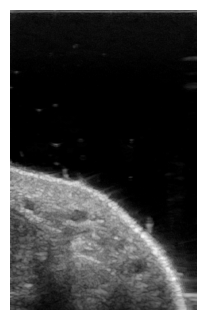

[114] Displaying: 9337_channel_0.npy


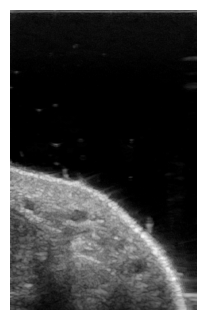

[115] Displaying: 9340_channel_0.npy


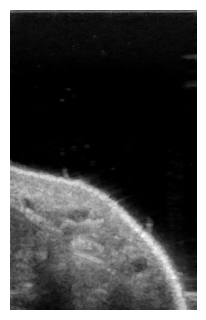

[116] Displaying: 9343_channel_0.npy


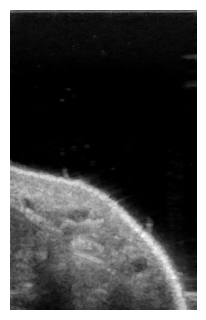

[117] Displaying: 9346_channel_0.npy


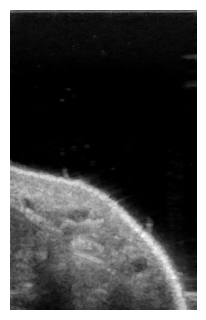

[118] Displaying: 9349_channel_0.npy


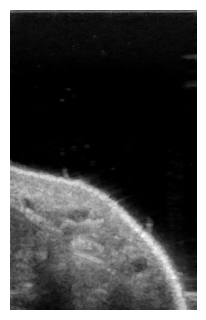

[119] Displaying: 9352_channel_0.npy


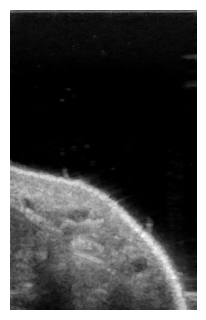

[120] Displaying: 9355_channel_0.npy


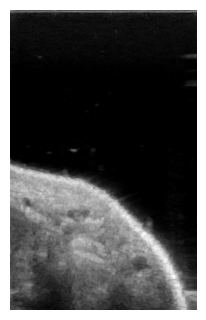

[121] Displaying: 9358_channel_0.npy


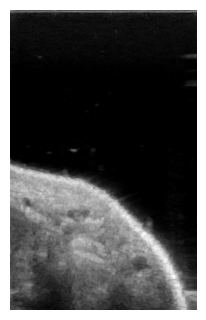

[122] Displaying: 9361_channel_0.npy


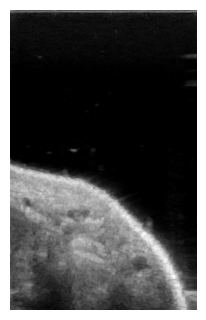

[123] Displaying: 9364_channel_0.npy


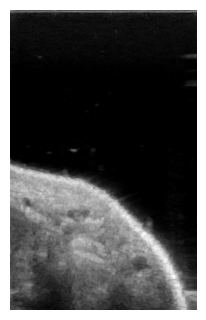

[124] Displaying: 9367_channel_0.npy


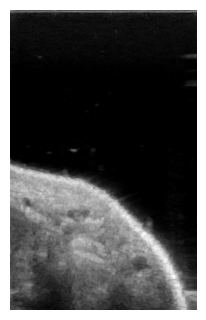

[125] Displaying: 9370_channel_0.npy


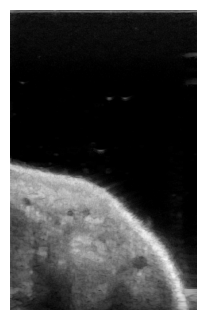

[126] Displaying: 9373_channel_0.npy


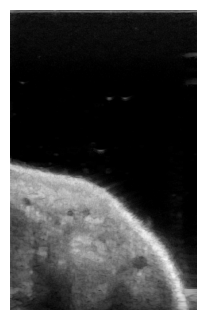

[127] Displaying: 9376_channel_0.npy


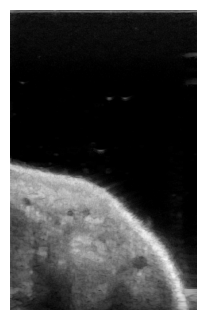

[128] Displaying: 9379_channel_0.npy


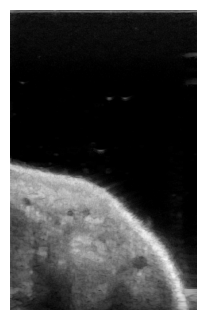

[129] Displaying: 9382_channel_0.npy


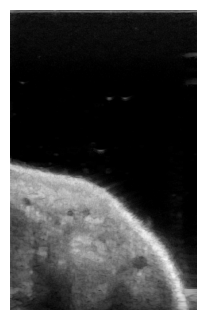

[130] Displaying: 9385_channel_0.npy


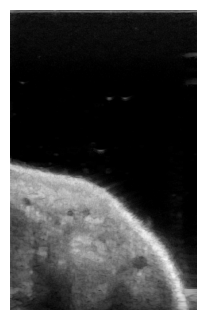

[131] Displaying: 9388_channel_0.npy


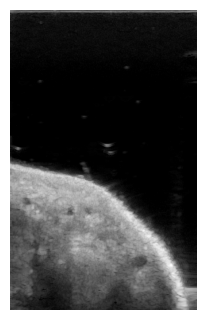

[132] Displaying: 9391_channel_0.npy


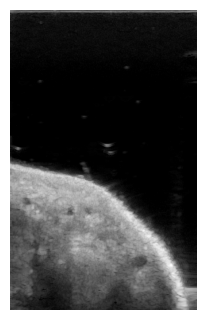

[133] Displaying: 9394_channel_0.npy


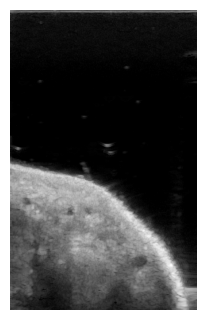

[134] Displaying: 9397_channel_0.npy


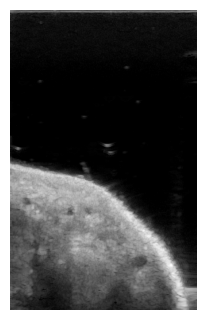

[135] Displaying: 9400_channel_0.npy


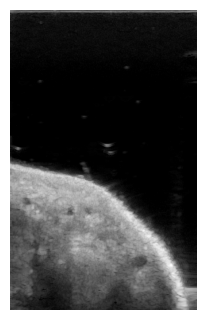

[136] Displaying: 9403_channel_0.npy


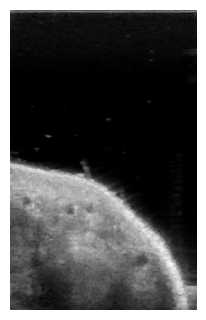

[137] Displaying: 9406_channel_0.npy


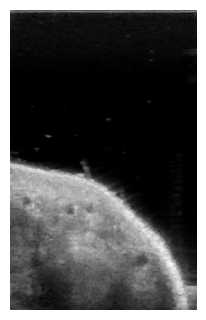

[138] Displaying: 9409_channel_0.npy


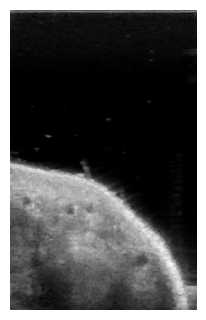

[139] Displaying: 9412_channel_0.npy


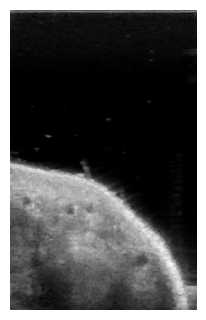

[140] Displaying: 9415_channel_0.npy


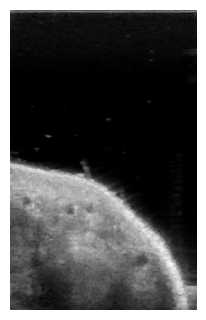

[141] Displaying: 9418_channel_0.npy


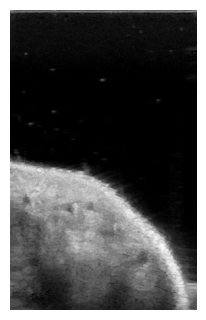

[142] Displaying: 9421_channel_0.npy


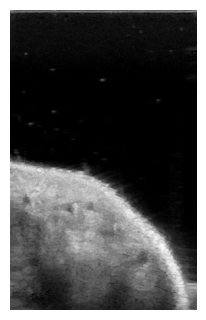

[143] Displaying: 9424_channel_0.npy


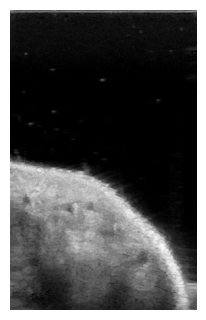

[144] Displaying: 9427_channel_0.npy


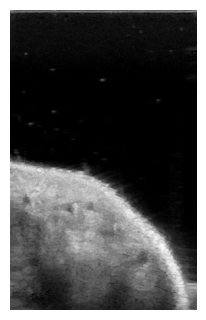

[145] Displaying: 9430_channel_0.npy


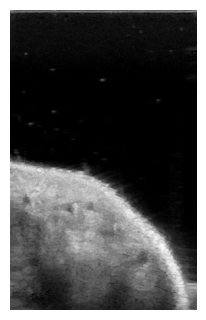

[146] Displaying: 9433_channel_0.npy


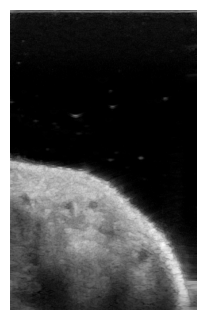

[147] Displaying: 9436_channel_0.npy


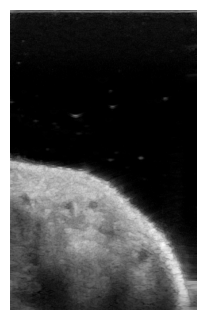

[148] Displaying: 9439_channel_0.npy


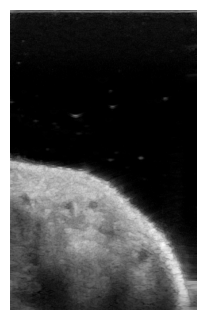

[149] Displaying: 9442_channel_0.npy


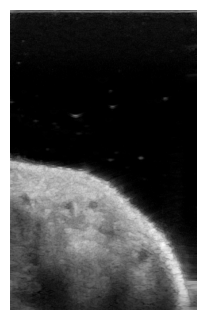

[150] Displaying: 9445_channel_0.npy


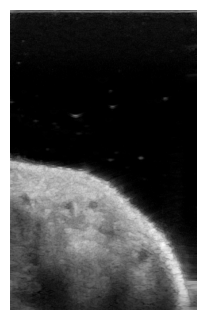

[151] Displaying: 9448_channel_0.npy


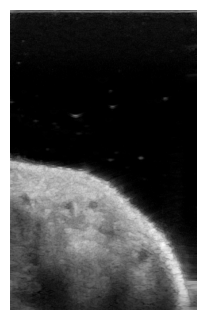

[152] Displaying: 9451_channel_0.npy


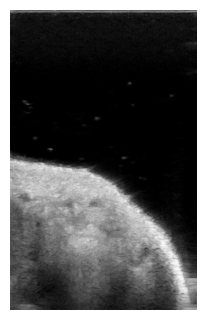

[153] Displaying: 9454_channel_0.npy


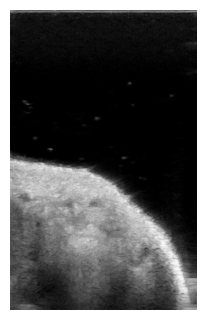

[154] Displaying: 9457_channel_0.npy


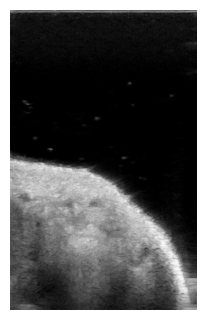

[155] Displaying: 9460_channel_0.npy


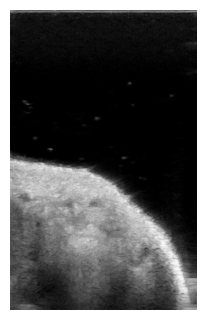

[156] Displaying: 9463_channel_0.npy


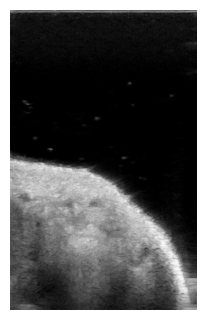

[157] Displaying: 9466_channel_0.npy


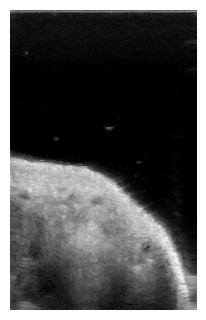

[158] Displaying: 9469_channel_0.npy


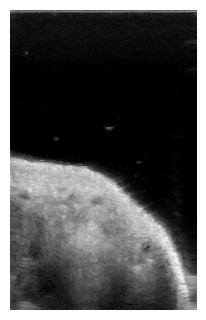

[159] Displaying: 9472_channel_0.npy


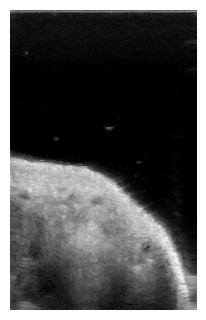

[160] Displaying: 9475_channel_0.npy


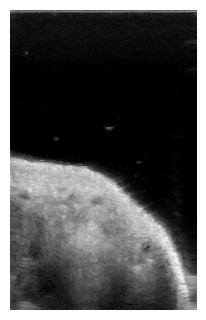

[161] Displaying: 9478_channel_0.npy


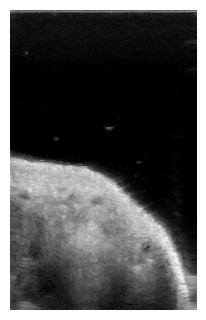

[162] Displaying: 9481_channel_0.npy


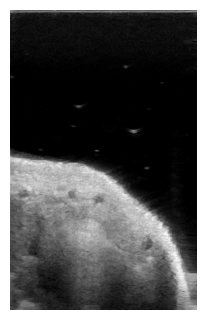

[163] Displaying: 9484_channel_0.npy


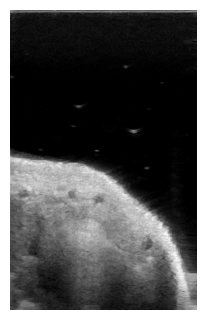

[164] Displaying: 9487_channel_0.npy


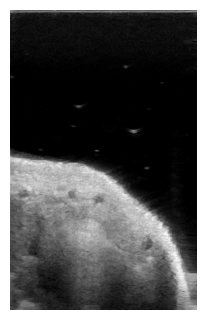

[165] Displaying: 9490_channel_0.npy


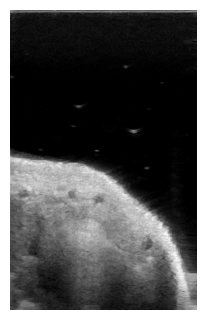

[166] Displaying: 9493_channel_0.npy


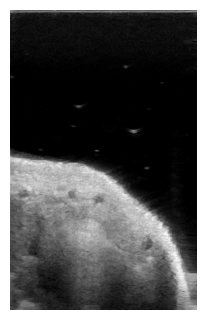

[167] Displaying: 9496_channel_0.npy


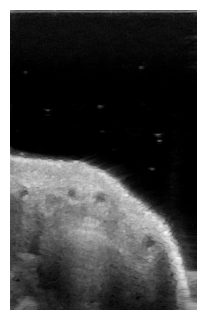

[168] Displaying: 9499_channel_0.npy


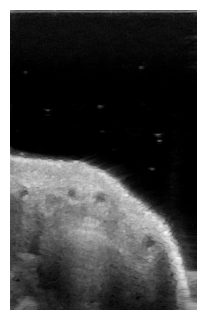

[169] Displaying: 9502_channel_0.npy


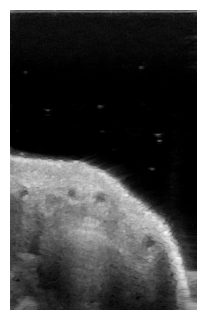

[170] Displaying: 9505_channel_0.npy


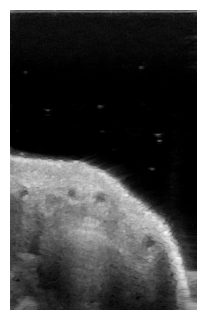

[171] Displaying: 9508_channel_0.npy


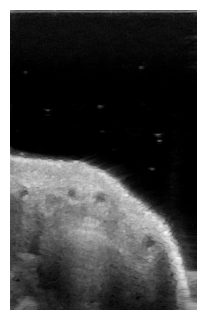

[172] Displaying: 9511_channel_0.npy


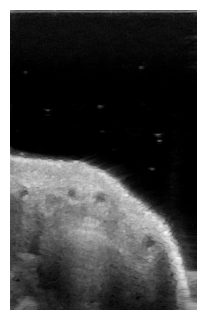

[173] Displaying: 9514_channel_0.npy


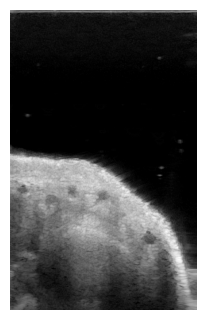

[174] Displaying: 9517_channel_0.npy


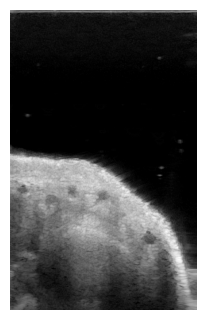

[175] Displaying: 9520_channel_0.npy


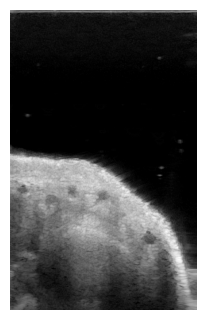

[176] Displaying: 9523_channel_0.npy


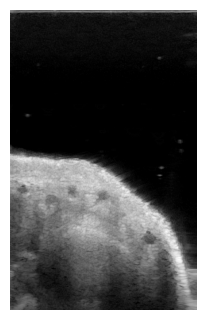

[177] Displaying: 9526_channel_0.npy


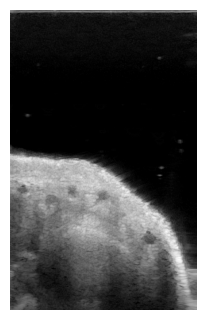

[178] Displaying: 9529_channel_0.npy


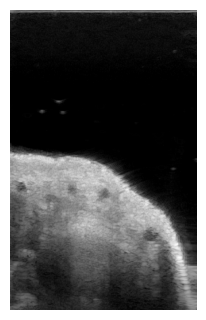

[179] Displaying: 9532_channel_0.npy


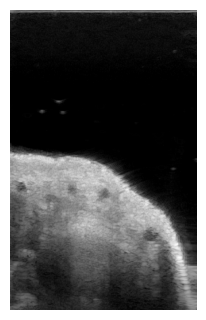

[180] Displaying: 9535_channel_0.npy


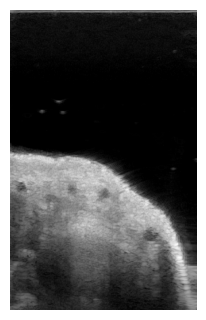

[181] Displaying: 9538_channel_0.npy


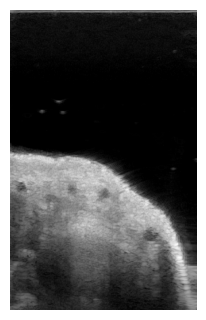

[182] Displaying: 9541_channel_0.npy


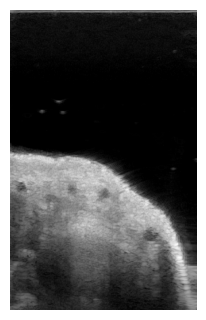

[183] Displaying: 9544_channel_0.npy


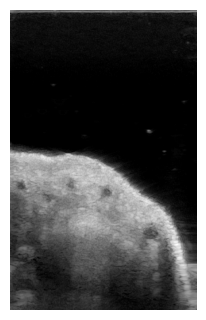

[184] Displaying: 9547_channel_0.npy


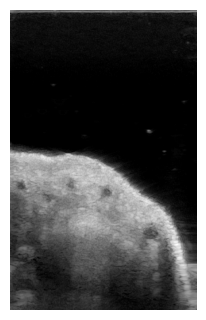

[185] Displaying: 9550_channel_0.npy


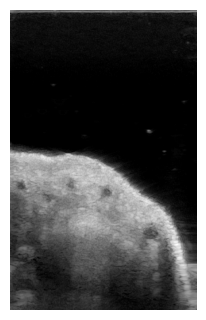

[186] Displaying: 9553_channel_0.npy


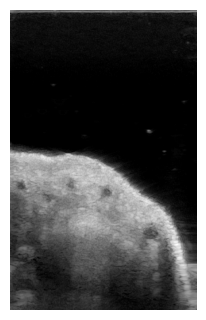

[187] Displaying: 9556_channel_0.npy


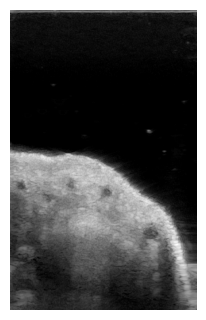

[188] Displaying: 9559_channel_0.npy


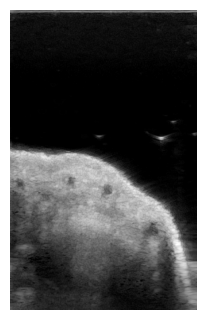

[189] Displaying: 9562_channel_0.npy


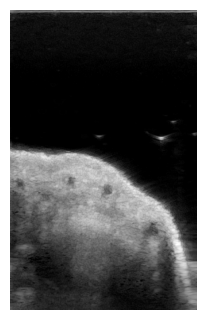

[190] Displaying: 9565_channel_0.npy


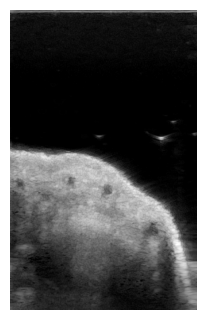

[191] Displaying: 9568_channel_0.npy


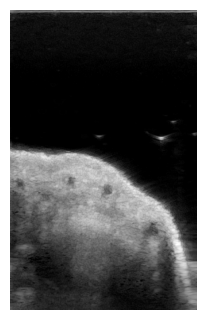

[192] Displaying: 9571_channel_0.npy


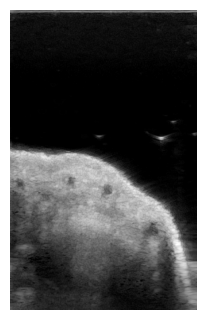

[193] Displaying: 9574_channel_0.npy


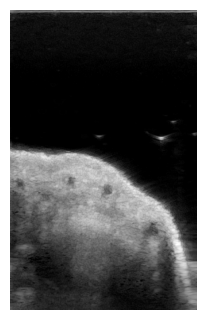

[194] Displaying: 9577_channel_0.npy


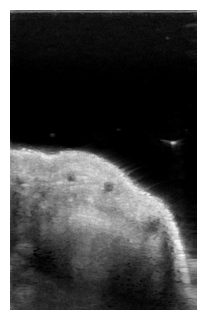

[195] Displaying: 9580_channel_0.npy


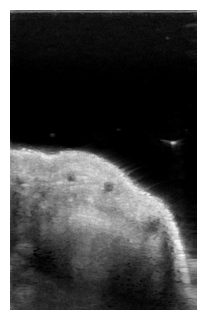

[196] Displaying: 9583_channel_0.npy


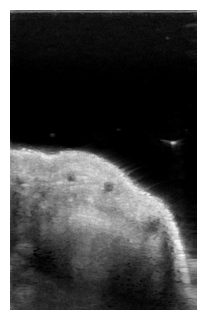

[197] Displaying: 9586_channel_0.npy


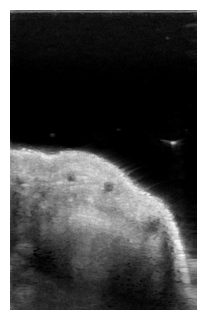

[198] Displaying: 9589_channel_0.npy


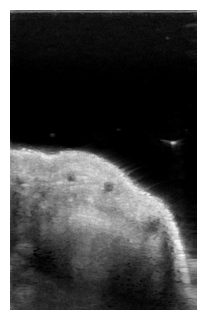

[199] Displaying: 9592_channel_0.npy


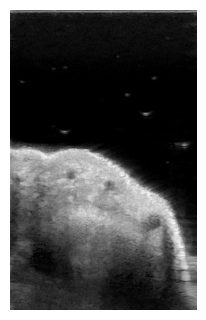

[200] Displaying: 9595_channel_0.npy


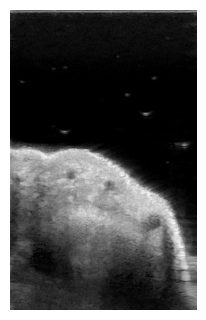

[201] Displaying: 9598_channel_0.npy


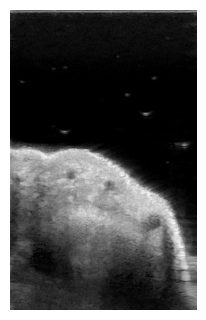

[202] Displaying: 9601_channel_0.npy


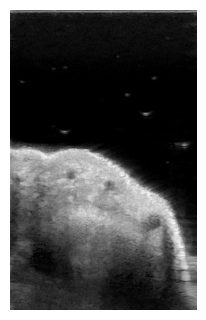

[203] Displaying: 9604_channel_0.npy


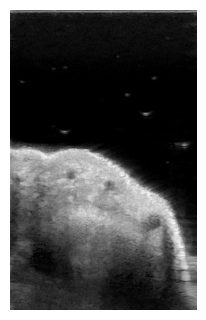

[204] Displaying: 9607_channel_0.npy


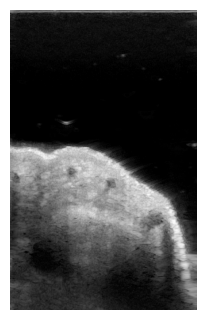

[205] Displaying: 9610_channel_0.npy


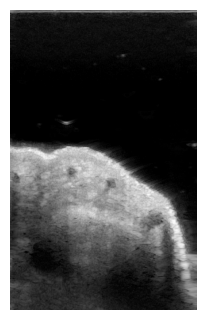

[206] Displaying: 9613_channel_0.npy


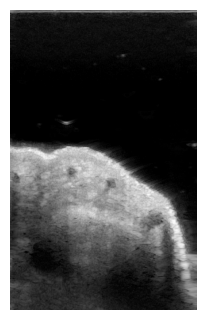

[207] Displaying: 9616_channel_0.npy


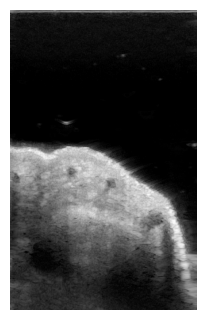

[208] Displaying: 9619_channel_0.npy


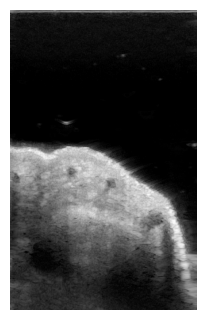

[209] Displaying: 9622_channel_0.npy


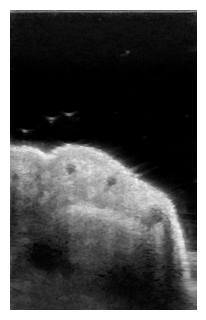

[210] Displaying: 9625_channel_0.npy


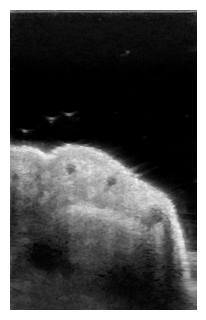

[211] Displaying: 9628_channel_0.npy


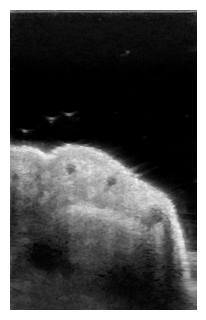

[212] Displaying: 9631_channel_0.npy


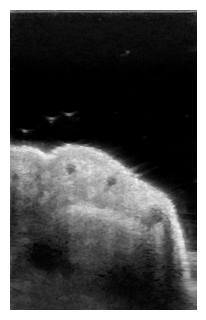

[213] Displaying: 9634_channel_0.npy


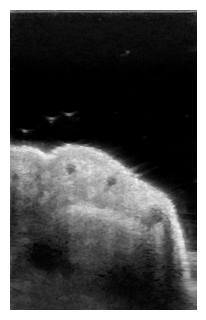

[214] Displaying: 9637_channel_0.npy


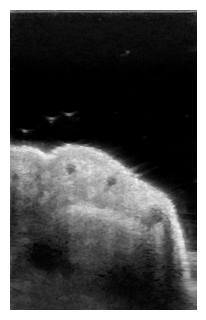

[215] Displaying: 9640_channel_0.npy


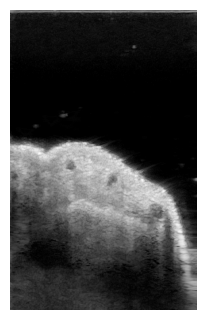

[216] Displaying: 9643_channel_0.npy


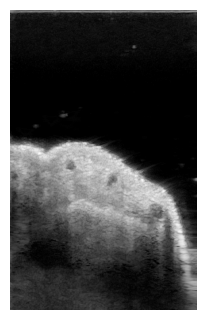

[217] Displaying: 9646_channel_0.npy


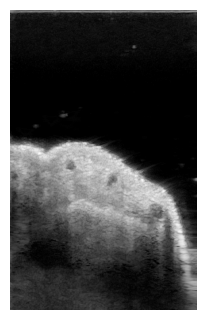

[218] Displaying: 9649_channel_0.npy


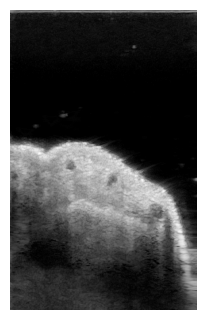

[219] Displaying: 9652_channel_0.npy


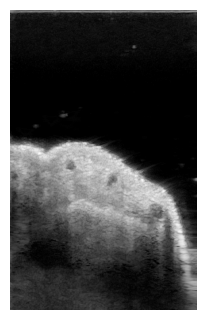

[220] Displaying: 9655_channel_0.npy


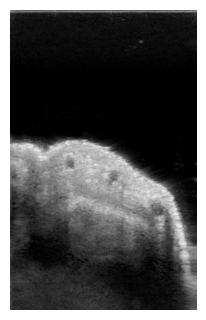

[221] Displaying: 9658_channel_0.npy


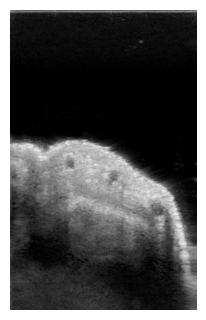

[222] Displaying: 9661_channel_0.npy


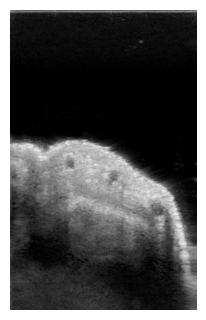

[223] Displaying: 9664_channel_0.npy


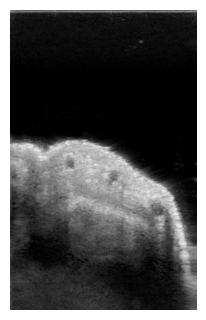

[224] Displaying: 9667_channel_0.npy


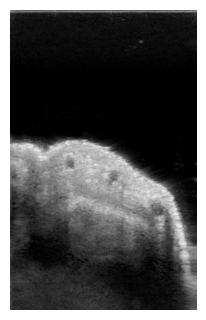

[225] Displaying: 9670_channel_0.npy


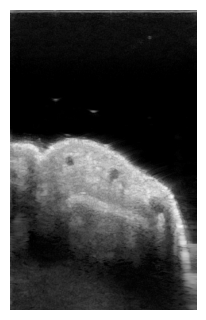

[226] Displaying: 9673_channel_0.npy


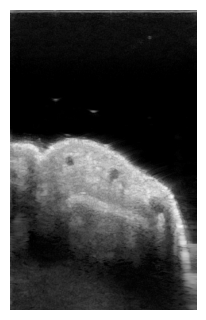

[227] Displaying: 9676_channel_0.npy


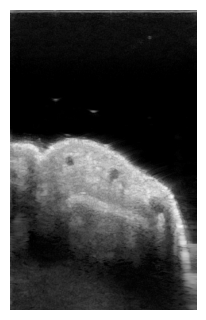

[228] Displaying: 9679_channel_0.npy


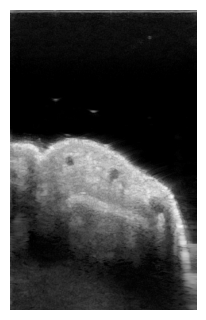

[229] Displaying: 9682_channel_0.npy


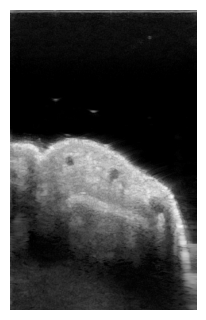

[230] Displaying: 9685_channel_0.npy


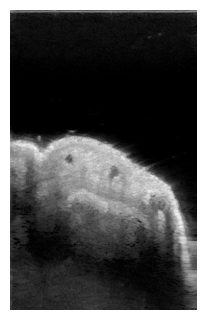

[231] Displaying: 9688_channel_0.npy


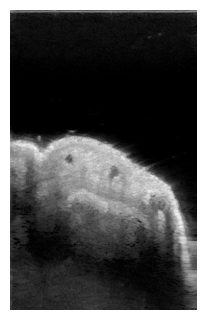

[232] Displaying: 9691_channel_0.npy


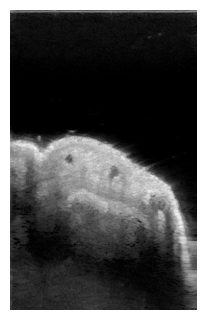

[233] Displaying: 9694_channel_0.npy


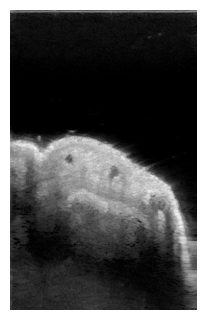

[234] Displaying: 9697_channel_0.npy


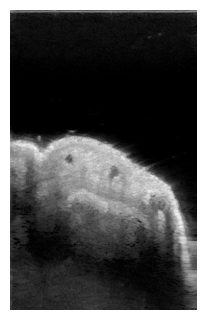

[235] Displaying: 9700_channel_0.npy


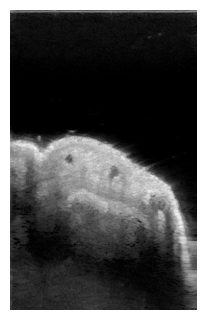

[236] Displaying: 9703_channel_0.npy


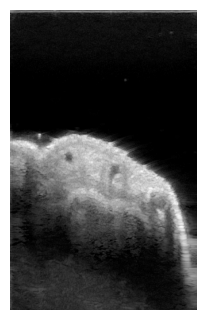

[237] Displaying: 9706_channel_0.npy


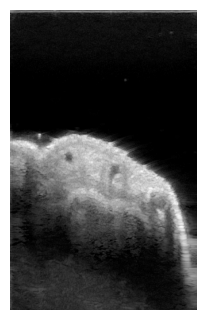

[238] Displaying: 9709_channel_0.npy


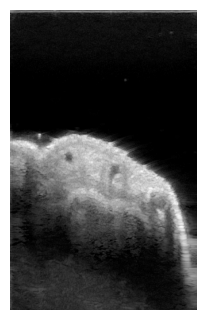

[239] Displaying: 9712_channel_0.npy


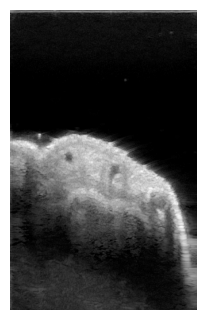

[240] Displaying: 9715_channel_0.npy


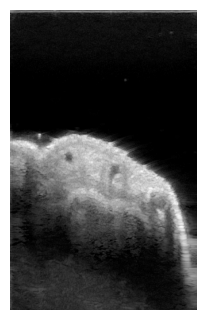

[241] Displaying: 9718_channel_0.npy


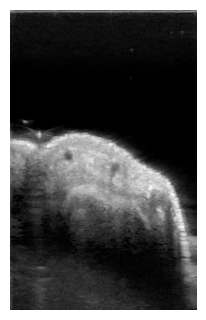

[242] Displaying: 9721_channel_0.npy


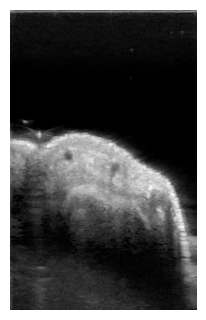

[243] Displaying: 9724_channel_0.npy


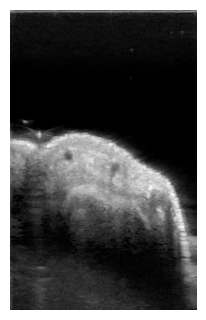

[244] Displaying: 9727_channel_0.npy


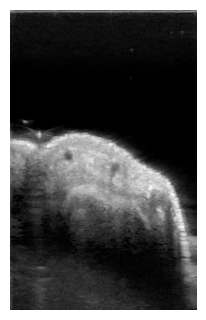

[245] Displaying: 9730_channel_0.npy


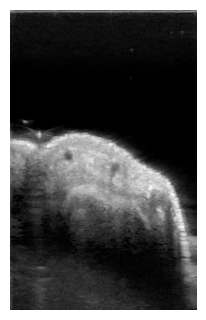

[246] Displaying: 9733_channel_0.npy


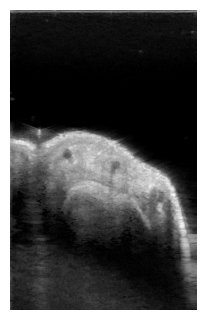

[247] Displaying: 9736_channel_0.npy


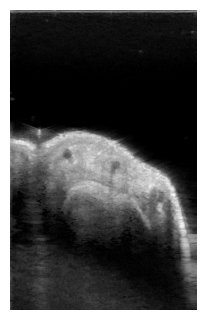

[248] Displaying: 9739_channel_0.npy


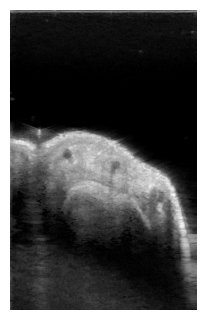

[249] Displaying: 9742_channel_0.npy


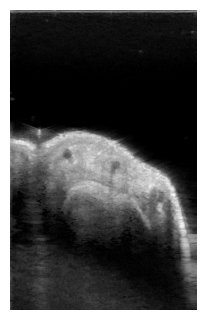

[250] Displaying: 9745_channel_0.npy


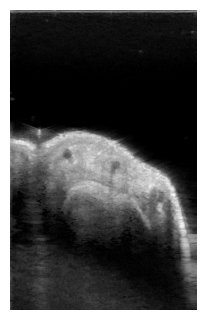

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re

# === Folder containing the images ===
base_path = Path("20251121_image2")

# === Numeric sort by index ===
def extract_index(path):
    m = re.match(r"(\d+)_channel_0\.npy", path.name)
    return int(m.group(1)) if m else float('inf')

file_list = sorted(base_path.glob("*_channel_0.npy"), key=extract_index)

target_shape = (1083, 277)

# === Parameters ===
offset = 3000      # <--- CHANGE this to shift starting point
max_plots = 250

matched_images = []
matched_paths = []

# === Collect matched images (shape filter) ===
for file_path in file_list:
    img = np.load(file_path).astype(np.float32)
    if img.shape == target_shape:
        matched_images.append(img)
        matched_paths.append(file_path)

# === Apply offset and limit ===
matched_images = matched_images[offset : offset + max_plots]
matched_paths  = matched_paths[offset : offset + max_plots]

print(f"Found {len(matched_images)} images to plot (offset={offset}).\n")

# === Plot ===
for idx, (img, file_path) in enumerate(zip(matched_images, matched_paths), start=1):

    # normalize
    vmax = np.max(img)
    if vmax > 0:
        img /= vmax

    print(f"[{idx}] Displaying: {file_path.name}")

    plt.figure(figsize=(2.5 * img.shape[1] / 371, 3.0 * img.shape[0] / 1083))
    plt.imshow(img, cmap='gray', aspect='auto')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from pathlib import Path

# === Example: Compute distances within the 1st group ===
g = 4  # first group
idx_group1 = np.where(groups == g)[0]           # indices of first group
ref_pos = positions[idx_group1[0]]              # first position of the first group
distances_from_first = np.linalg.norm(positions[idx_group1] - ref_pos, axis=1) * 1000 * 100

# === Paths ===
base_path = Path("20251121_image1")  # ✅ use Path, not string

# === Parameters ===
offset = idx_group1[0]
num_images = idx_group1.shape[0]
smooth_window = 21          # must be odd, controls smoothness along Z
poly_order = 3
interval = 1                # sagittal slice interval

# === Load all 2D planes (no resize) ===
plane_images = []
for idx in range(num_images):
    file_path = base_path / f"{offset + idx}_channel_0.npy"
    if not file_path.exists():
        print(f"⚠️ Missing: {file_path}")
        continue

    img = np.load(file_path).astype(np.float32)
    vmax = np.max(img)
    if vmax > 0:
        img /= vmax  # normalize to [0,1]
    plane_images.append(img)

plane_images = np.array(plane_images, dtype=np.float32)
print(f"✅ Loaded {plane_images.shape[0]} planes of shape {plane_images.shape[1:]}")

# === Display each image ===
for i, img in enumerate(plane_images):
    img_crop = img[:, :]
    print(f"Displaying image {i} | cropped shape: {img_crop.shape}")

    plt.figure(figsize=(2.5 * img_crop.shape[1] / 371, 3 * img_crop.shape[0] / 1083))
    plt.imshow(img_crop, cmap='gray', aspect='auto', vmin=0.15, vmax=0.8)
    plt.axis('off')
    # plt.title(f"Image {offset + i}", fontsize=9)
    plt.tight_layout(pad=0)
    plt.show()


⚠️ Missing: 20251121_image1\1215_channel_0.npy
⚠️ Missing: 20251121_image1\1218_channel_0.npy
⚠️ Missing: 20251121_image1\1221_channel_0.npy
⚠️ Missing: 20251121_image1\1224_channel_0.npy
⚠️ Missing: 20251121_image1\1227_channel_0.npy
⚠️ Missing: 20251121_image1\1230_channel_0.npy
⚠️ Missing: 20251121_image1\1233_channel_0.npy
⚠️ Missing: 20251121_image1\1236_channel_0.npy
⚠️ Missing: 20251121_image1\1239_channel_0.npy
⚠️ Missing: 20251121_image1\1242_channel_0.npy
⚠️ Missing: 20251121_image1\1245_channel_0.npy
⚠️ Missing: 20251121_image1\1248_channel_0.npy
⚠️ Missing: 20251121_image1\1251_channel_0.npy
⚠️ Missing: 20251121_image1\1254_channel_0.npy
⚠️ Missing: 20251121_image1\1257_channel_0.npy
⚠️ Missing: 20251121_image1\1260_channel_0.npy
⚠️ Missing: 20251121_image1\1263_channel_0.npy
⚠️ Missing: 20251121_image1\1266_channel_0.npy
⚠️ Missing: 20251121_image1\1269_channel_0.npy
⚠️ Missing: 20251121_image1\1272_channel_0.npy
⚠️ Missing: 20251121_image1\1275_channel_0.npy
⚠️ Missing: 2

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (228,) + inhomogeneous part.

Displaying image index 0 | shape: (1083, 371)


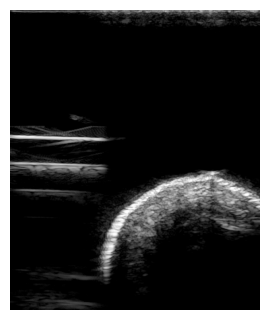

Displaying image index 1 | shape: (1083, 371)


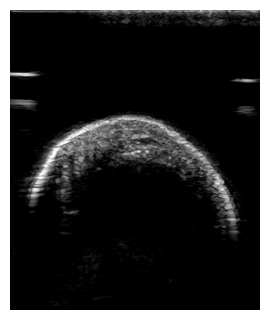

Displaying image index 2 | shape: (1083, 371)


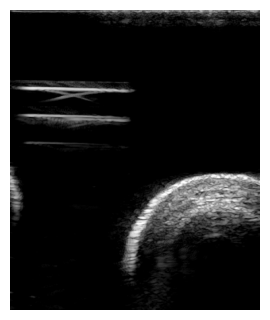

Displaying image index 3 | shape: (1083, 371)


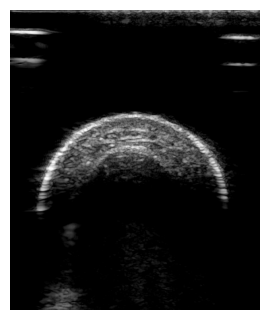

Displaying image index 4 | shape: (1083, 371)


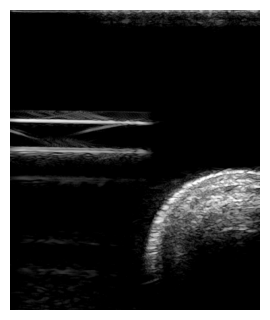

Displaying image index 5 | shape: (1083, 371)


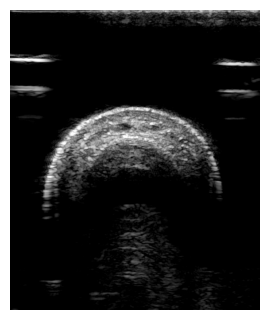

Displaying image index 6 | shape: (1083, 371)


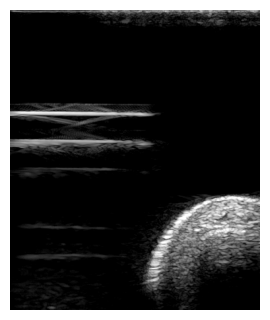

Displaying image index 7 | shape: (1083, 371)


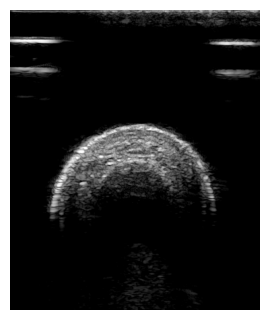

Displaying image index 8 | shape: (1083, 371)


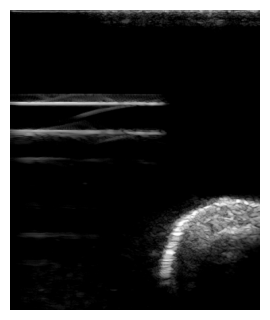

Displaying image index 9 | shape: (1083, 371)


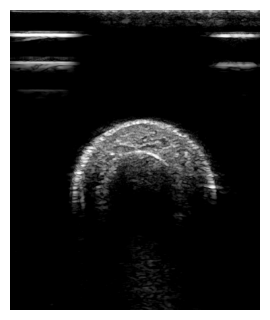

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# === Folder path ===
base_path = Path("20251118_image3")

# === test_idx: indices of files test_#.npy ===
test_idx = range(0, 10)   # will load test_0.npy ~ test_9.npy

# === Load and display each image ===
for idx in test_idx:
    file_path = base_path / f"test_{idx}.npy"   # <-- FIXED

    if not file_path.exists():
        print(f"⚠️ Missing: {file_path}")
        continue

    img = np.load(file_path).astype(np.float32)

    # normalize 0–1
    vmax = np.max(img)
    if vmax > 0:
        img /= vmax

    print(f"Displaying image index {idx} | shape: {img.shape}")

    # figure scaled by image size
    plt.figure(figsize=(2.5 * img.shape[1] / 371,
                        3.0 * img.shape[0] / 1083))

    plt.imshow(img, cmap='gray', aspect='auto', vmin=0.10, vmax=0.90)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()


In [44]:
before_water = np.load(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot5\joint_physical.npy", allow_pickle = True)
before_water

array([['MCP', 2, -0.13515150898466233, 0.20560556002756075],
       ['MCP', 5, -0.07044083982700906, 0.15619405409249015],
       ['MCP', 9, -0.029859572728141767, 0.15619405409249015],
       ['MCP', 13, 0.005237739357365088, 0.17156652260562322],
       ['MCP', 17, 0.031560723421495226, 0.199017359236218],
       ['PIP', 3, -0.15160337402474366, 0.15509602062726635],
       ['PIP', 6, -0.08360233185907413, 0.08591991231816752],
       ['PIP', 10, -0.027665990722797587, 0.08152777845727237],
       ['PIP', 14, 0.02717355941080687, 0.10678254815741955],
       ['PIP', 18, 0.07104519951769044, 0.1649783218142805]], dtype=object)

In [ ]:
after_water_joints = np.load(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot7\joint_physical.npy", allow_pickle = True)
after_water_joints

array([['MCP', 2, -0.1384418819926786, 0.20450752656233695],
       ['MCP', 5, -0.07263442183235325, 0.15729208755771396],
       ['MCP', 9, -0.030956363730813855, 0.15948815448816153],
       ['MCP', 13, 0.004140948354692999, 0.1748606230012946],
       ['MCP', 17, 0.03375430542683941, 0.2001153927014418],
       ['PIP', 3, -0.1494097920193995, 0.14850781983592362],
       ['PIP', 6, -0.08469912286174623, 0.08262581192249616],
       ['PIP', 10, -0.02876278172546968, 0.07823367806160099],
       ['PIP', 14, 0.023883186402790604, 0.10458648122697198],
       ['PIP', 18, 0.07214199052036253, 0.16388028834905669]],
      dtype=object)

In [48]:
after_water_pc = np.load(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot7\pc_4.npy", allow_pickle = True)
after_water_pc[:10, :]

array([[-0.40498763, -0.25961   ,  0.67600006,  0.5137255 ,  0.69803923,
         0.84705883],
       [-0.4042462 , -0.25961   ,  0.67600006,  0.5176471 ,  0.69411767,
         0.84705883],
       [-0.40290785, -0.25922593,  0.675     ,  0.5176471 ,  0.69411767,
         0.84705883],
       [-0.40216753, -0.25922593,  0.675     ,  0.5137255 ,  0.69803923,
         0.85490197],
       [-0.4014272 , -0.25922593,  0.675     ,  0.5137255 ,  0.69803923,
         0.85490197],
       [-0.40009326, -0.2588419 ,  0.674     ,  0.50980395,  0.69411767,
         0.8509804 ],
       [-0.39935404, -0.2588419 ,  0.674     ,  0.5137255 ,  0.69803923,
         0.85490197],
       [-0.39861476, -0.2588419 ,  0.674     ,  0.4862745 ,  0.7019608 ,
         0.84705883],
       [-0.39787552, -0.2588419 ,  0.674     ,  0.47058824,  0.6862745 ,
         0.83137256],
       [-0.3971363 , -0.2588419 ,  0.674     ,  0.41960785,  0.6784314 ,
         0.8352941 ]], dtype=float32)

In [ ]:
import numpy as np

# === Load data ===
joints = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot5\joint_physical.npy",
    allow_pickle=True
)

pc = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot5\pc_3.npy",
    allow_pickle=True
)

# pc format: [x, y, z, r, g, b]
xyz = pc[:, :3]   # just keep x,y,z


# === Function: find nearest Z for each joint XY ===
def find_joint_z(joint_xy, xyz_points):
    # joint_xy = (x, y)
    dx = xyz_points[:, 0] - joint_xy[0]
    dy = xyz_points[:, 1] - joint_xy[1]

    # Euclidean distance on XY-plane
    dist = dx*dx + dy*dy
    idx = np.argmin(dist)     # nearest point index

    return xyz_points[idx, 2], idx


# === Process all joints ===
results = []

for row in joints:
    joint_type = row[0]       # "MCP" or "PIP"
    finger_idx = int(row[1])  # 2,5,9,13,17 ... etc
    x = float(row[2])
    y = float(row[3])

    z, idx = find_joint_z((x, y), xyz)

    results.append([joint_type, finger_idx, x, y, z])

    print(f"{joint_type}{finger_idx:2d}:  XY=({x:.4f}, {y:.4f})  →  Z={z:.4f} (pc idx {idx})")


# === Convert to numpy array for later use ===
results = np.array(results, dtype=object)


MCP 2:  XY=(-0.1352, 0.2056)  →  Z=0.5970 (pc idx 698369)
MCP 5:  XY=(-0.0704, 0.1562)  →  Z=0.5560 (pc idx 637060)
MCP 9:  XY=(-0.0299, 0.1562)  →  Z=0.5230 (pc idx 654128)
MCP13:  XY=(0.0052, 0.1716)  →  Z=0.5330 (pc idx 674768)
MCP17:  XY=(0.0316, 0.1990)  →  Z=0.6310 (pc idx 670464)
PIP 3:  XY=(-0.1516, 0.1551)  →  Z=0.5850 (pc idx 620453)
PIP 6:  XY=(-0.0836, 0.0859)  →  Z=0.5490 (pc idx 512998)
PIP10:  XY=(-0.0277, 0.0815)  →  Z=0.5520 (pc idx 504609)
PIP14:  XY=(0.0272, 0.1068)  →  Z=0.5520 (pc idx 549946)
PIP18:  XY=(0.0710, 0.1650)  →  Z=0.5860 (pc idx 637280)


In [56]:
import numpy as np

# === Load joint XY data ===
joints = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot6\joint_physical.npy",
    allow_pickle=True
)

# === Load point cloud (xyzrgb format) ===
pc = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot6\pc_3.npy",
    allow_pickle=True
)

xyz = pc[:, :3]   # extract (x,y,z)

RADIUS = 0.005    # 5 mm


def compute_z_from_radius(xy, xyz_points, R=0.005):
    x, y = xy

    # Compute XY-plane squared distance
    dx = xyz_points[:, 0] - x
    dy = xyz_points[:, 1] - y
    dist2 = dx*dx + dy*dy

    # Find points within the radius
    mask = dist2 <= R*R
    subset = xyz_points[mask]

    if subset.shape[0] > 0:
        # average Z in neighborhood
        return float(np.mean(subset[:, 2])), subset.shape[0]
    else:
        # fallback: nearest neighbor
        idx_near = np.argmin(dist2)
        return float(xyz_points[idx_near, 2]), 1


# === Evaluate all joints ===
results = []

for row in joints:
    joint_type = row[0]         # "MCP" or "PIP"
    finger_idx = int(row[1])    # 2,5,9,...
    x = float(row[2])
    y = float(row[3])

    z_mean, count = compute_z_from_radius((x, y), xyz, RADIUS)

    results.append([joint_type, finger_idx, x, y, z_mean, count])

    print(f"{joint_type}{finger_idx:2d}: XY=({x:.4f},{y:.4f}) → Z≈{z_mean:.4f} m using {count} points")



MCP 2: XY=(-0.1417,0.2100) → Z≈0.5733 m using 149 points
MCP 5: XY=(-0.0759,0.1584) → Z≈0.5436 m using 78 points
MCP 9: XY=(-0.0331,0.1584) → Z≈0.5149 m using 280 points
MCP13: XY=(0.0030,0.1749) → Z≈0.5151 m using 85 points
MCP17: XY=(0.0316,0.2001) → Z≈0.5863 m using 305 points
PIP 3: XY=(-0.1571,0.1573) → Z≈0.5537 m using 380 points
PIP 6: XY=(-0.0880,0.0826) → Z≈0.5362 m using 224 points
PIP10: XY=(-0.0310,0.0760) → Z≈0.5380 m using 251 points
PIP14: XY=(0.0283,0.1057) → Z≈0.5373 m using 214 points
PIP18: XY=(0.0721,0.1639) → Z≈0.5682 m using 227 points


In [4]:
import numpy as np
from pathlib import Path

# ================================
# Load joints
# ================================
joints = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\closest_points.npy",
    allow_pickle=True
)

# ================================
# Load & concatenate all pcs (pc_0 ~ pc_4)
# ================================
folder = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4")

pcs = []
for i in range(5):
    f = folder / f"pc_{i}.npy"
    print("Loading:", f)
    pcs.append(np.load(f, allow_pickle=True))

pc_all = np.concatenate(pcs, axis=0)
xyz = pc_all[:, :3]   # extract (x, y, z) only

print(f"\nTotal concatenated point count: {xyz.shape[0]}\n")

# ================================
# Back-projection function
# ================================
RADIUS = 0.001  # 5 mm

def compute_z_from_radius(xy, xyz_points, R=0.005):
    x, y = xy

    dx = xyz_points[:, 0] - x
    dy = xyz_points[:, 1] - y
    dist2 = dx*dx + dy*dy

    mask = dist2 <= R*R
    subset = xyz_points[mask]

    if subset.shape[0] > 0:
        return float(np.mean(subset[:, 2])), subset.shape[0]
    else:
        idx_near = np.argmin(dist2)
        return float(xyz_points[idx_near, 2]), 1

# ================================
# Evaluate all joints
# ================================
results = []

for row in joints:
    x = float(row[0])
    y = float(row[1])

    z_mean, count = compute_z_from_radius((x, y), xyz, RADIUS)

    results.append([x, y, z_mean, count])

    print(f" XY=({x:.4f},{y:.4f}) → "
          f"Z≈{z_mean:.4f} m using {count} points")


Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_4.npy

Total concatenated point count: 3631295

 XY=(-0.0677,0.1222) → Z≈0.5459 m using 44 points
 XY=(-0.0386,0.0940) → Z≈0.5465 m using 44 points
 XY=(-0.0152,0.0936) → Z≈0.5488 m using 46 points
 XY=(0.0047,0.1012) → Z≈0.5510 m using 45 points
 XY=(0.0211,0.1135) → Z≈0.5520 m using 45 points
 XY=(-0.0766,0.0960) → Z≈0.5883 m using 82 points
 XY=(-0.0443,0.0534) → Z≈0.5521 m using 45 points
 XY=(-0.0140,0.0492) → Z≈0.5490 m using 42 points
 XY=(0.0132,0.0634) → Z≈0.5539 m using 45 points
 XY=(0.0375,0.0890) → Z≈0.5526 m using 41 points


Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_4.npy

Total concatenated point count: 3374379

 XY=(-0.0670,0.1182) → Z≈0.5344 m using 5 points
 XY=(-0.0354,0.0920) → Z≈0.5366 m using 5 points
 XY=(-0.0131,0.0915) → Z≈0.5374 m using 5 points
 XY=(0.0063,0.0992) → Z≈0.5372 m using 5 points
 XY=(0.0234,0.1134) → Z≈0.5378 m using 5 points
 XY=(-0.0755,0.0910) → Z≈0.5485 m using 6 points
 XY=(-0.0423,0.0531) → Z≈0.5422 m using 5 points
 XY=(-0.0125,0.0478) → Z≈0.5354 m using 5 points
 XY=(0.0157,0.0619) → Z≈0.5368 m using 5 points
 XY=(0.0420,0.0898) → Z≈0.5406 m using 5 points


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
C:\Users\labadmin\AppData\Local\Temp\ipykernel_1244\2890886535.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


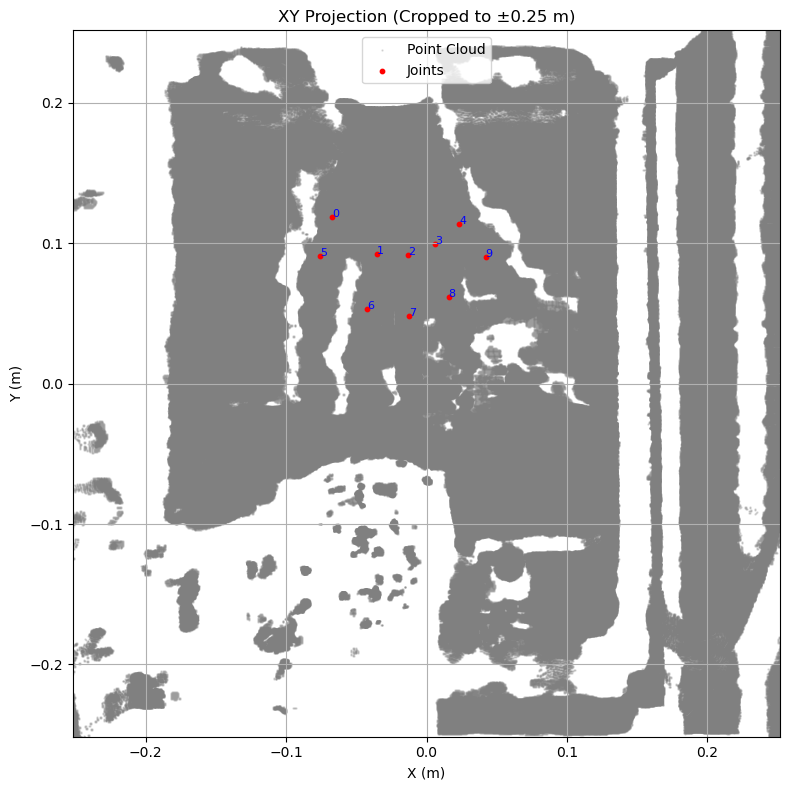

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ================================
# Load joints
# ================================
joints = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\closest_points.npy",
    allow_pickle=True
)

# ================================
# Load & concatenate all pcs (pc_0 ~ pc_4)
# ================================
folder = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4")

pcs = []
for i in range(5):
    f = folder / f"pc_{i}.npy"   # <-- FIXED
    print("Loading:", f)
    pcs.append(np.load(f, allow_pickle=True))

pc_all = np.concatenate(pcs, axis=0)
xyz = pc_all[:, :3]   # extract (x, y, z) only

print(f"\nTotal concatenated point count: {xyz.shape[0]}\n")

# ================================
# Back-projection function
# ================================
RADIUS = 0.0002  # 5 mm

def compute_z_from_radius(xy, xyz_points, R=0.005):
    x, y = xy

    dx = xyz_points[:, 0] - x
    dy = xyz_points[:, 1] - y
    dist2 = dx * dx + dy * dy

    mask = dist2 <= R * R
    subset = xyz_points[mask]

    if subset.shape[0] > 0:
        return float(np.mean(subset[:, 2])), subset.shape[0]
    else:
        idx_near = np.argmin(dist2)
        return float(xyz_points[idx_near, 2]), 1


# ================================
# Evaluate all joints
# ================================
results = []

for row in joints:
    x = float(row[0])
    y = float(row[1])

    z_mean, count = compute_z_from_radius((x, y), xyz, RADIUS)

    results.append([x, y, z_mean, count])

    print(f" XY=({x:.4f},{y:.4f}) → Z≈{z_mean:.4f} m using {count} points")


# ================================
# PLOT: XY Projection with HARD CROP ±0.25
# ================================
plt.figure(figsize=(8, 8))

# plot point cloud
plt.scatter(xyz[:, 0], xyz[:, 1], s=0.5, c='gray', alpha=0.25, label="Point Cloud")

# joint positions
joint_x = joints[:, 0].astype(float)
joint_y = joints[:, 1].astype(float)

plt.scatter(joint_x, joint_y, s=10, c='red', label="Joints")

# labels
for idx, (jx, jy) in enumerate(zip(joint_x, joint_y)):
    plt.text(jx, jy, f"{idx}", fontsize=8, color='blue')

plt.title("XY Projection (Cropped to ±0.25 m)")
plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.axis('equal')
plt.grid(True)
plt.legend()

# ===== FIXED HARD LIMITS =====
plt.xlim(-0.25, 0.25)
plt.ylim(-0.25, 0.25)

plt.tight_layout()
plt.show()



Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_4.npy
Total points: (3216902, 6)


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
C:\Users\labadmin\AppData\Local\Temp\ipykernel_1244\2772132504.py:72: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
c:\Users\labadmin\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


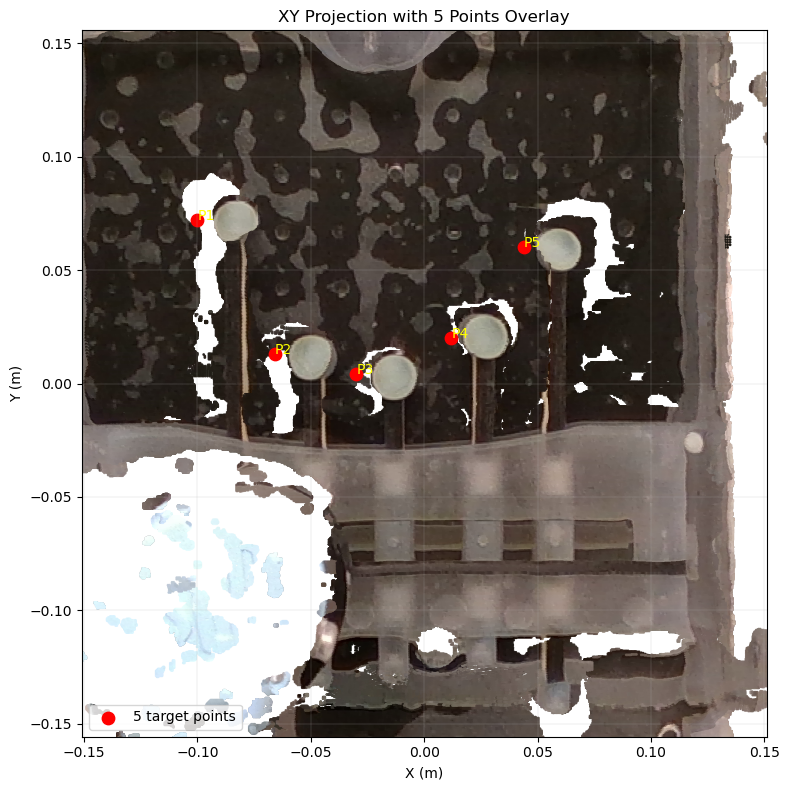

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ==========================================
# Folder with pc_0.npy ~ pc_4.npy
# ==========================================
folder = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5")

# Five points (X,Y,Z)
points = [
    (-0.100, 0.072, 0.548),
    (-0.066, 0.013, 0.549),
    (-0.030, 0.004, 0.548),
    (0.012, 0.020, 0.544),
    (0.044, 0.060, 0.544)
]

pcs = []
for i in range(5):
    f = folder / f"pc_{i}.npy"
    print("Loading:", f)
    pc = np.load(f, allow_pickle=True)
    pcs.append(pc)

# ==========================================
# Concatenate all point clouds
# ==========================================
pc_all = np.concatenate(pcs, axis=0)
print("Total points:", pc_all.shape)

# ==========================================
# Extract geometry + color
# ==========================================
xyz = pc_all[:, :3]      # x, y, z
rgb = pc_all[:, 3:6]     # r, g, b (0-255)

rgb = rgb.astype(np.float32)  # If wrong colors: divide by 255

x = xyz[:, 0]
y = xyz[:, 1]

# ==========================================
# PLOT XY projection
# ==========================================
plt.figure(figsize=(8, 8))

# base point cloud
plt.scatter(x, y, s=1, c=rgb, alpha=0.9)

# overlay the 5 points (XY only)
px = [p[0] for p in points]
py = [p[1] for p in points]

plt.scatter(px, py, s=80, c='red', label='5 target points')

# optional labels
for i, (xx, yy) in enumerate(zip(px, py), start=1):
    plt.text(xx, yy, f"P{i}", color='yellow', fontsize=10)

plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.title("XY Projection with 5 Points Overlay")
plt.axis("equal")

# ---- Hard Crop: ONLY show -0.15 ~ +0.15 ----
plt.xlim(-0.15, 0.15)
plt.ylim(-0.15, 0.15)

plt.grid(True, linewidth=0.3, alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_4.npy
Total points: (3216902, 6)


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
C:\Users\labadmin\AppData\Local\Temp\ipykernel_1244\2844434998.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


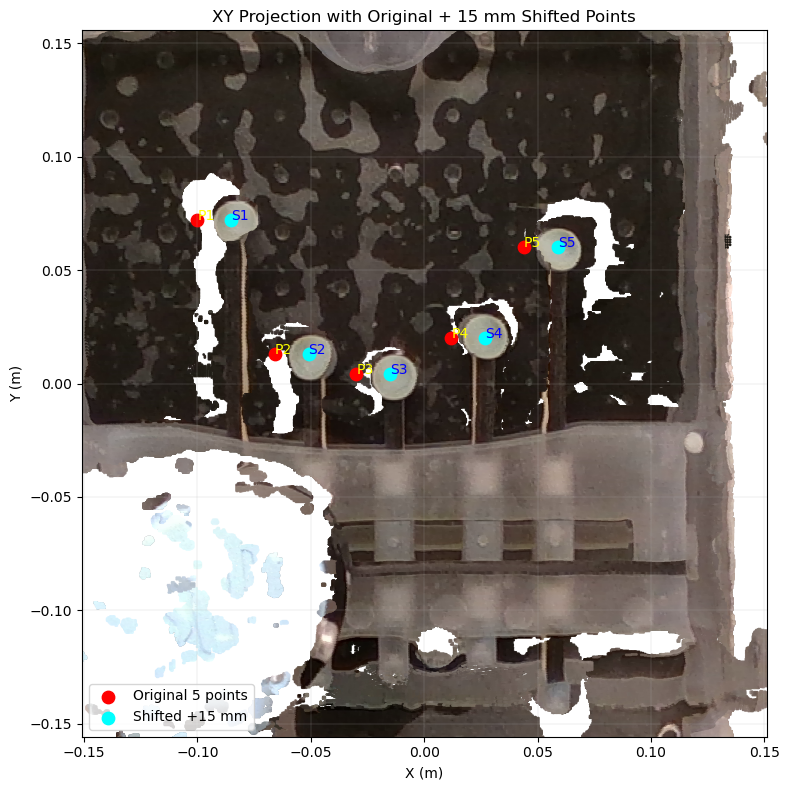

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ==========================================
# Folder with pc_0.npy ~ pc_4.npy
# ==========================================
folder = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5")

# Five points (X,Y,Z)
points = [
    (-0.100, 0.072, 0.548),
    (-0.066, 0.013, 0.549),
    (-0.030, 0.004, 0.548),
    (0.012, 0.020, 0.544),
    (0.044, 0.060, 0.544)
]

# === Add 5 more points shifted +15 mm (=0.015 m) in X
shift_val = 0.016  # 15 mm
points_shifted = [(p[0] + shift_val, p[1], p[2]) for p in points]

pcs = []
for i in range(5):
    f = folder / f"pc_{i}.npy"
    print("Loading:", f)
    pc = np.load(f, allow_pickle=True)
    pcs.append(pc)

# ==========================================
# Concatenate all point clouds
# ==========================================
pc_all = np.concatenate(pcs, axis=0)
print("Total points:", pc_all.shape)

# ==========================================
# Extract geometry + color
# ==========================================
xyz = pc_all[:, :3]      # x, y, z
rgb = pc_all[:, 3:6]     # r, g, b (0-255)

rgb = rgb.astype(np.float32)  # If colors look wrong, divide by 255

x = xyz[:, 0]
y = xyz[:, 1]

# ==========================================
# PLOT XY projection
# ==========================================
plt.figure(figsize=(8, 8))

# Base point cloud
plt.scatter(x, y, s=1, c=rgb, alpha=0.9)

# Original 5 points
px = [p[0] for p in points]
py = [p[1] for p in points]
plt.scatter(px, py, s=80, c='red', label='Original 5 points')

# Shifted 5 points (+15 mm in X)
px2 = [p[0] for p in points_shifted]
py2 = [p[1] for p in points_shifted]
plt.scatter(px2, py2, s=80, c='cyan', label='Shifted +15 mm')

# Labels for both sets
for i, (xx, yy) in enumerate(zip(px, py), start=1):
    plt.text(xx, yy, f"P{i}", color='yellow', fontsize=10)
for i, (xx, yy) in enumerate(zip(px2, py2), start=1):
    plt.text(xx, yy, f"S{i}", color='blue', fontsize=10)

plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.title("XY Projection with Original + 15 mm Shifted Points")
plt.axis("equal")

# ---- Hard Crop: ONLY show -0.15 ~ +0.15 ----
plt.xlim(-0.15, 0.15)
plt.ylim(-0.15, 0.15)

plt.grid(True, linewidth=0.3, alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5\pc_4.npy
Total points: (3216902, 6)

===== Closest-point Z for shifted points =====
S1: XY=(-0.0830, 0.0720) → Z_closest=0.5450 (pc index=2384156)
S2: XY=(-0.0490, 0.0130) → Z_closest=0.5500 (pc index=2289021)
S3: XY=(-0.0130, 0.0040) → Z_closest=0.5470 (pc index=2275907)
S4: XY=(0.0290, 0.0200) → Z_closest=0.5450 (pc index=2899736)
S5: XY=(0.0610, 0.0600) → Z_closest=0.5450 (pc index=2963166)


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
C:\Users\labadmin\AppData\Local\Temp\ipykernel_1244\677330072.py:105: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


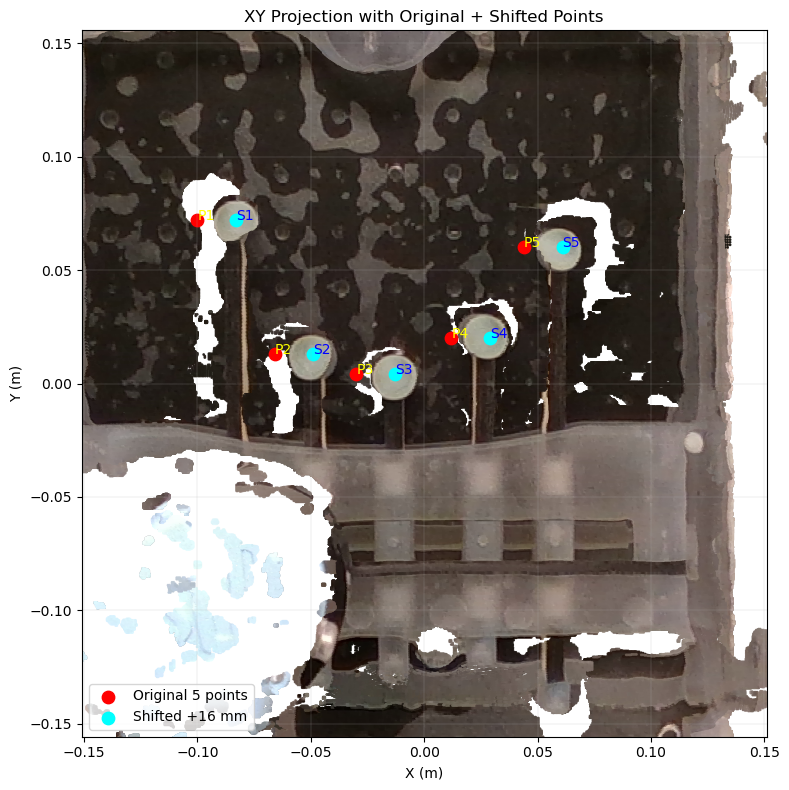

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ==========================================
# Folder with pc_0.npy ~ pc_4.npy
# ==========================================
folder = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test5")

# Five points (X,Y,Z)
points = [
    (-0.100, 0.072, 0.548),
    (-0.066, 0.013, 0.549),
    (-0.030, 0.004, 0.548),
    (0.012, 0.020, 0.544),
    (0.044, 0.060, 0.544)
]

# === Add 5 more points shifted +16 mm (=0.016 m) in X
shift_val = 0.017
points_shifted = [(p[0] + shift_val, p[1], p[2]) for p in points]

pcs = []
for i in range(5):
    f = folder / f"pc_{i}.npy"
    print("Loading:", f)
    pc = np.load(f, allow_pickle=True)
    pcs.append(pc)

# ==========================================
# Concatenate all point clouds
# ==========================================
pc_all = np.concatenate(pcs, axis=0)
print("Total points:", pc_all.shape)

# ==========================================
# Extract geometry + color
# ==========================================
xyz = pc_all[:, :3]      # x, y, z
rgb = pc_all[:, 3:6]     # r, g, b (0–255)

rgb = rgb.astype(np.float32)   # correct normalization

x = xyz[:, 0]
y = xyz[:, 1]
z = xyz[:, 2]

# ==========================================
# Closest-point Z lookup function
# ==========================================
def get_closest_z(x0, y0, xyz):
    dx = xyz[:, 0] - x0
    dy = xyz[:, 1] - y0
    dist2 = dx*dx + dy*dy
    idx = np.argmin(dist2)
    return float(xyz[idx, 2]), idx


# ==========================================
# Compute Z for each shifted point
# ==========================================
print("\n===== Closest-point Z for shifted points =====")
closest_z_list = []
for i, (x0, y0, z0) in enumerate(points_shifted, start=1):
    z_closest, idx_closest = get_closest_z(x0, y0, xyz)
    closest_z_list.append(z_closest)
    print(f"S{i}: XY=({x0:.4f}, {y0:.4f}) → Z_closest={z_closest:.4f} (pc index={idx_closest})")


# ==========================================
# PLOT XY projection
# ==========================================
plt.figure(figsize=(8, 8))

# Base point cloud
plt.scatter(x, y, s=1, c=rgb, alpha=0.9)

# Original 5 points
px = [p[0] for p in points]
py = [p[1] for p in points]
plt.scatter(px, py, s=80, c='red', label='Original 5 points')

# Shifted 5 points
px2 = [p[0] for p in points_shifted]
py2 = [p[1] for p in points_shifted]
plt.scatter(px2, py2, s=80, c='cyan', label='Shifted +16 mm')

# Labels
for i, (xx, yy) in enumerate(zip(px, py), start=1):
    plt.text(xx, yy, f"P{i}", color='yellow', fontsize=10)
for i, (xx, yy) in enumerate(zip(px2, py2), start=1):
    plt.text(xx, yy, f"S{i}", color='blue', fontsize=10)

plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.title("XY Projection with Original + Shifted Points")
plt.axis("equal")

# Hard crop
plt.xlim(-0.15, 0.15)
plt.ylim(-0.15, 0.15)

plt.grid(True, linewidth=0.3, alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


In [12]:
def compute_z_from_closest(xy, xyz_points):
    x, y = xy

    dx = xyz_points[:, 0] - x
    dy = xyz_points[:, 1] - y
    dist2 = dx*dx + dy*dy

    idx = np.argmin(dist2)
    z = float(xyz_points[idx, 2])
    return z, 1


# ================================
# Evaluate all joints using closest point only
# ================================
results = []

for row in joints:
    x = float(row[0])
    y = float(row[1])

    z_closest, count = compute_z_from_closest((x, y), xyz)

    results.append([x, y, z_closest, count])

    print(f"XY=({x:.4f},{y:.4f}) → Z={z_closest:.4f} (closest point)")


XY=(-0.0670,0.1182) → Z=0.5350 (closest point)
XY=(-0.0354,0.0920) → Z=0.5360 (closest point)
XY=(-0.0131,0.0915) → Z=0.5370 (closest point)
XY=(0.0063,0.0992) → Z=0.5370 (closest point)
XY=(0.0234,0.1134) → Z=0.5370 (closest point)
XY=(-0.0755,0.0910) → Z=0.5370 (closest point)
XY=(-0.0423,0.0531) → Z=0.5420 (closest point)
XY=(-0.0125,0.0478) → Z=0.5360 (closest point)
XY=(0.0157,0.0619) → Z=0.5360 (closest point)
XY=(0.0420,0.0898) → Z=0.5410 (closest point)


In [27]:
import numpy as np
from pathlib import Path
from itertools import combinations

# ==========================================
# Paths
# ==========================================
folder_A = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4")
folder_B = Path(r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test3")

# ==========================================
# Load joint files
# ==========================================
joints_A = np.load(folder_A / "joint_physical.npy", allow_pickle=True)
joints_B = np.load(folder_B / "joint_physical.npy", allow_pickle=True)

# ==========================================
# Load pcs 0~4 from each folder
# ==========================================
def load_all_pcs(folder):
    pcs = []
    for i in range(5):
        f = folder / f"pc_{i}.npy"
        print("Loading:", f)
        pc = np.load(f, allow_pickle=True)
        pcs.append(pc[:, :3])  # xyz only
    return pcs

pcs_A = load_all_pcs(folder_A)
pcs_B = load_all_pcs(folder_B)

# ==========================================
# Z-from-radius function
# ==========================================
RADIUS = 0.005  # 5 mm

def compute_z(xy, xyz):
    x, y = xy
    dx = xyz[:, 0] - x
    dy = xyz[:, 1] - y
    dist2 = dx*dx + dy*dy

    mask = dist2 <= RADIUS * RADIUS
    subset = xyz[mask]

    if subset.shape[0] > 0:
        return float(np.mean(subset[:, 2]))
    else:  # fallback nearest neighbor
        idx = np.argmin(dist2)
        return float(xyz[idx, 2])

# ==========================================
# Evaluate Z for all joints for a given PC
# ==========================================
def evaluate(joints, xyz):
    zvals = []
    for row in joints:
        x, y = float(row[2]), float(row[3])
        zvals.append(compute_z((x, y), xyz))
    return np.array(zvals)

# ==========================================
# Build 5C2 = 10 pairs per dataset
# ==========================================
pairs_A = list(combinations(range(5), 2))
pairs_B = list(combinations(range(5), 2))

print(f"\nTotal combinations = {len(pairs_A)} × {len(pairs_B)} = {len(pairs_A) * len(pairs_B)}\n")

# ==========================================
# Grid search all 100 combinations
# ==========================================
TARGET = -0.01

best_score = 1e9
best_pair = None
best_stats = None  # (avg_delta, std_delta, delta_vector)

print("\n============== SEARCHING 100 COMBINATIONS ==============\n")

for a0, a1 in pairs_A:
    pcA = np.concatenate([pcs_A[a0], pcs_A[a1]], axis=0)

    for b0, b1 in pairs_B:
        pcB = np.concatenate([pcs_B[b0], pcs_B[b1]], axis=0)

        zA = evaluate(joints_A, pcA)
        zB = evaluate(joints_B, pcB)

        delta = zA - zB
        avg_delta = np.mean(delta)
        std_delta = np.std(delta)

        score = abs(avg_delta - TARGET) + std_delta

        print(f"A_pc({a0},{a1}) vs B_pc({b0},{b1}) → "
              f"avg ΔZ={avg_delta:+.4f}, std={std_delta:.6f}, score={score:.6f}")

        if score < best_score:
            best_score = score
            best_pair = ((a0, a1), (b0, b1))
            best_stats = (avg_delta, std_delta, delta)

# ==========================================
# Print BEST combination
# ==========================================
avg_delta, std_delta, delta_vec = best_stats
(pA0, pA1), (pB0, pB1) = best_pair

print("\n========================= BEST 2-PC COMBINATION =========================")
print(f"PC_A = (pc_{pA0}, pc_{pA1})")
print(f"PC_B = (pc_{pB0}, pc_{pB1})")
print(f"Average ΔZ = {avg_delta:+.4f}   (target = -0.01)")
print(f"Standard Deviation = {std_delta:.6f}  (lower is better)")
print(f"Score = {best_score:.6f}")
print("\nPer-joint ΔZ values:")
print(delta_vec)
print("=========================================================================\n")


Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test4\pc_4.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test3\pc_0.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test3\pc_1.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test3\pc_2.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test3\pc_3.npy
Loading: C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test3\pc_4.npy

Total combinations = 10 × 10 = 100


============== SEARCHING 100 COMBINATIONS ==============

A_pc(0,1) vs B_pc(0,1) → avg ΔZ=+0.0163, std=0.014802, score=0.041140
A_pc(0,1) vs B_pc(0,2) → avg ΔZ=+0.0160, std=0.015141, score=0.041134
A_pc(0,1) vs B_pc(0,3) → avg ΔZ=+0.0173, std=0.013750,

In [28]:
from itertools import combinations

# ================================
# Choose 2 pcs out of 5 → total 10 pairs
# ================================
pairs_A = list(combinations(range(5), 2))
pairs_B = list(combinations(range(5), 2))

print(f"\nTotal combinations: {len(pairs_A)} * {len(pairs_B)} = {len(pairs_A)*len(pairs_B)}\n")

# ================================
# Grid search 100 combinations
# ================================
TARGET = 0.01
best_score = 1e9
best_pair = None
best_stats = None  # (avg, std, delta_vec)

print("\n============== SEARCHING 100 COMBINATIONS ==============\n")

for a0, a1 in pairs_A:
    # concatenate those two pcs for dataset A
    pcA = np.concatenate([pcs_A[a0], pcs_A[a1]], axis=0)
    
    for b0, b1 in pairs_B:
        # concatenate those two pcs for dataset B
        pcB = np.concatenate([pcs_B[b0], pcs_B[b1]], axis=0)

        # compute Z for joints
        zA = evaluate(joints_A, pcA)
        zB = evaluate(joints_B, pcB)

        delta = zA - zB
        avg_delta = np.mean(delta)
        std_delta = np.std(delta)

        score = abs(avg_delta - TARGET) + std_delta

        print(f"A_pc({a0},{a1}) vs B_pc({b0},{b1}) → "
              f"avg ΔZ={avg_delta:+.4f}, std={std_delta:.6f}, score={score:.6f}")

        if score < best_score:
            best_score = score
            best_pair = ((a0, a1), (b0, b1))
            best_stats = (avg_delta, std_delta, delta)

# ================================
# Print best result
# ================================
avg_delta, std_delta, delta_vec = best_stats
(pA0, pA1), (pB0, pB1) = best_pair

print("\n========================= BEST 2-PC COMBINATION =========================")
print(f"PC_A = (pc_{pA0}, pc_{pA1})")
print(f"PC_B = (pc_{pB0}, pc_{pB1})")
print(f"Average ΔZ = {avg_delta:+.4f}")
print(f"Standard Deviation = {std_delta:.6f}  (lower is better)")
print(f"Score = {best_score:.6f}")
print("\nPer-joint ΔZ values:")
print(delta_vec)
print("=========================================================================\n")



Total combinations: 10 * 10 = 100


============== SEARCHING 100 COMBINATIONS ==============

A_pc(0,1) vs B_pc(0,1) → avg ΔZ=+0.0163, std=0.014802, score=0.021140
A_pc(0,1) vs B_pc(0,2) → avg ΔZ=+0.0160, std=0.015141, score=0.021134
A_pc(0,1) vs B_pc(0,3) → avg ΔZ=+0.0173, std=0.013750, score=0.021025
A_pc(0,1) vs B_pc(0,4) → avg ΔZ=+0.0170, std=0.013794, score=0.020794
A_pc(0,1) vs B_pc(1,2) → avg ΔZ=+0.0149, std=0.015901, score=0.020849
A_pc(0,1) vs B_pc(1,3) → avg ΔZ=+0.0162, std=0.014403, score=0.020600
A_pc(0,1) vs B_pc(1,4) → avg ΔZ=+0.0159, std=0.014381, score=0.020297
A_pc(0,1) vs B_pc(2,3) → avg ΔZ=+0.0158, std=0.014769, score=0.020576
A_pc(0,1) vs B_pc(2,4) → avg ΔZ=+0.0156, std=0.014765, score=0.020360
A_pc(0,1) vs B_pc(3,4) → avg ΔZ=+0.0168, std=0.013352, score=0.020176
A_pc(0,2) vs B_pc(0,1) → avg ΔZ=+0.0165, std=0.012920, score=0.019388
A_pc(0,2) vs B_pc(0,2) → avg ΔZ=+0.0161, std=0.013184, score=0.019308
A_pc(0,2) vs B_pc(0,3) → avg ΔZ=+0.0174, std=0.011943, score=0.01

In [14]:
import numpy as np
from pathlib import Path

# ==========================
# Load Joints
# ==========================
folder_A = r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test2"
folder_B = r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test"

joints_A = np.load(Path(folder_A) / "joint_physical.npy", allow_pickle=True)
joints_B = np.load(Path(folder_B) / "joint_physical.npy", allow_pickle=True)

# ==========================
# Load all PC files
# ==========================
def load_pc_set(folder):
    pcs = []
    for i in range(5):
        f = Path(folder) / f"pc_{i}.npy"
        pcs.append(np.load(f, allow_pickle=True)[:, :3])  # xyz only
    return pcs

pcs_A = load_pc_set(folder_A)
pcs_B = load_pc_set(folder_B)

# ==========================
# Z computation
# ==========================
RADIUS = 0.005

def compute_z(xy, xyz_points):
    x, y = xy
    dx = xyz_points[:, 0] - x
    dy = xyz_points[:, 1] - y
    dist2 = dx*dx + dy*dy

    mask = dist2 <= RADIUS*RADIUS
    subset = xyz_points[mask]

    if subset.shape[0] > 0:
        return float(np.mean(subset[:, 2]))
    else:
        idx = np.argmin(dist2)
        return float(xyz_points[idx, 2])

def eval_dataset(joints, pc):
    out = []
    for row in joints:
        x, y = float(row[2]), float(row[3])
        z = compute_z((x, y), pc)
        out.append(z)
    return np.array(out)  # shape (10,)

# ==========================
# Grid search for best PC combo
# ==========================
TARGET = -0.01   # desired delta Z
best_error = 1e9
best_pair = None
best_stats = None

for i in range(5):           # pc_A index
    for j in range(5):       # pc_B index
        zA = eval_dataset(joints_A, pcs_A[i])
        zB = eval_dataset(joints_B, pcs_B[j])

        delta = zA - zB                    # vector of 10 joints
        avg_delta = np.mean(delta)         # average ΔZ for combination
        error = abs(avg_delta - TARGET)    # closeness to -0.01

        print(f"PC_A={i}, PC_B={j}, avg ΔZ={avg_delta:+.4f}, error={error:.6f}")

        if error < best_error:
            best_error = error
            best_pair = (i, j)
            best_stats = (avg_delta, delta)

# ==========================
# Print best result
# ==========================
print("\n======================")
print(" BEST PC COMBINATION ")
print("======================")
print(f"PC_A = pc_{best_pair[0]}")
print(f"PC_B = pc_{best_pair[1]}")
print(f"Average ΔZ = {best_stats[0]:+.4f} (target = -0.01)")
print(f"Error = {best_error:.6f}\n")
print("Per-joint ΔZ values:")
print(best_stats[1])


PC_A=0, PC_B=0, avg ΔZ=-0.0126, error=0.002574
PC_A=0, PC_B=1, avg ΔZ=-0.0119, error=0.001863
PC_A=0, PC_B=2, avg ΔZ=-0.0122, error=0.002179
PC_A=0, PC_B=3, avg ΔZ=-0.0141, error=0.004141
PC_A=0, PC_B=4, avg ΔZ=-0.0132, error=0.003228
PC_A=1, PC_B=0, avg ΔZ=-0.0125, error=0.002496
PC_A=1, PC_B=1, avg ΔZ=-0.0118, error=0.001785
PC_A=1, PC_B=2, avg ΔZ=-0.0121, error=0.002101
PC_A=1, PC_B=3, avg ΔZ=-0.0141, error=0.004063
PC_A=1, PC_B=4, avg ΔZ=-0.0132, error=0.003150
PC_A=2, PC_B=0, avg ΔZ=-0.0119, error=0.001943
PC_A=2, PC_B=1, avg ΔZ=-0.0112, error=0.001232
PC_A=2, PC_B=2, avg ΔZ=-0.0115, error=0.001548
PC_A=2, PC_B=3, avg ΔZ=-0.0135, error=0.003510
PC_A=2, PC_B=4, avg ΔZ=-0.0126, error=0.002597
PC_A=3, PC_B=0, avg ΔZ=-0.0123, error=0.002329
PC_A=3, PC_B=1, avg ΔZ=-0.0116, error=0.001618
PC_A=3, PC_B=2, avg ΔZ=-0.0119, error=0.001935
PC_A=3, PC_B=3, avg ΔZ=-0.0139, error=0.003897
PC_A=3, PC_B=4, avg ΔZ=-0.0130, error=0.002983
PC_A=4, PC_B=0, avg ΔZ=-0.0122, error=0.002177
PC_A=4, PC_B=

In [15]:
import numpy as np

# ================================
# ===== Load Dataset A (robot9)
# ================================
joints_A = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test2\joint_physical.npy",
    allow_pickle=True
)

pc_A = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test2\pc_2.npy",
    allow_pickle=True
)


# ================================
# ===== Load Dataset B (robot_test)
# ================================
joints_B = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test\joint_physical.npy",
    allow_pickle=True
)

pc_B = np.load(
    r"C:\Users\labadmin\Desktop\RUSS2\20251118_robot_test\pc_1.npy",
    allow_pickle=True
)


# ================================
# ===== Shared parameters
# ================================
RADIUS = 0.005  # 5 mm neighborhood


def compute_z_from_radius(xy, xyz_points, R=0.005):
    x, y = xy

    dx = xyz_points[:, 0] - x
    dy = xyz_points[:, 1] - y
    dist2 = dx*dx + dy*dy

    mask = dist2 <= R*R
    subset = xyz_points[mask]

    if subset.shape[0] > 0:
        return float(np.mean(subset[:, 2])), subset.shape[0]
    else:
        idx_near = np.argmin(dist2)
        return float(xyz_points[idx_near, 2]), 1


# ================================
# ===== Process function
# ================================
def process_dataset(joints, pc):
    xyz = pc[:, :3]
    out = []
    for row in joints:
        jtype = row[0]
        fidx = int(row[1])
        x, y = float(row[2]), float(row[3])
        z_est, cnt = compute_z_from_radius((x, y), xyz, RADIUS)
        out.append([jtype, fidx, x, y, z_est, cnt])
    return out


# ================================
# ===== Compute results
# ================================
res_A = process_dataset(joints_A, pc_A)
res_B = process_dataset(joints_B, pc_B)

# Print comparisons
print("\n=== Comparison: robot9 VS robot_test ===\n")
for (a, b) in zip(res_A, res_B):
    jA, idxA, xA, yA, zA, nA = a
    jB, idxB, xB, yB, zB, nB = b

    print(f"{jA}{idxA:2d} | Z_A={zA:.4f} m (n={nA:3d})   "
          f"Z_B={zB:.4f} m (n={nB:3d})   "
          f"ΔZ={zA - zB:+.4f} m")



=== Comparison: robot9 VS robot_test ===

MCP 2 | Z_A=0.5732 m (n=247)   Z_B=0.5956 m (n=312)   ΔZ=-0.0224 m
MCP 5 | Z_A=0.5398 m (n=166)   Z_B=0.5568 m (n= 46)   ΔZ=-0.0170 m
MCP 9 | Z_A=0.5178 m (n=289)   Z_B=0.5239 m (n=293)   ΔZ=-0.0061 m
MCP13 | Z_A=0.5153 m (n= 16)   Z_B=0.5234 m (n= 58)   ΔZ=-0.0081 m
MCP17 | Z_A=0.5929 m (n=280)   Z_B=0.6052 m (n=263)   ΔZ=-0.0123 m
PIP 3 | Z_A=0.5509 m (n=366)   Z_B=0.5735 m (n=326)   ΔZ=-0.0227 m
PIP 6 | Z_A=0.5586 m (n=359)   Z_B=0.5550 m (n=279)   ΔZ=+0.0036 m
PIP10 | Z_A=0.5407 m (n=231)   Z_B=0.5472 m (n=240)   ΔZ=-0.0064 m
PIP14 | Z_A=0.5382 m (n=207)   Z_B=0.5477 m (n=210)   ΔZ=-0.0095 m
PIP18 | Z_A=0.5709 m (n=221)   Z_B=0.5823 m (n=204)   ΔZ=-0.0114 m
